# Do some more advanced plotting for the best configuration of predictorvariables and architecture 

##  sections 4.2.5 and 5.2.1 in thesis

In [16]:
import os
import glob

import numpy as np
import math

import copy
import re
from datetime import datetime

import gzip
import netCDF4 as nc
import pickle

from braceexpand import braceexpand
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import matplotlib.pyplot as plt
import matplotlib

import cartopy
import cartopy.mpl.geoaxes
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point

In [17]:
DIRECTORY_DATASETS_INTERPOLATED = "Datasets/Interpolated/"
DIRECTORY_DATASETS_ORIGINAL = "Datasets/Original/"
DIRECTORY_IMAGES = "Images/"
DIRECTORY_OUTPUTS = "Output/Hyperparameter_tuning/"

# Give criteria for the dataset and open all files that match these criteria

In [18]:
def braced_glob(path):
    l = []
    for x in braceexpand(path):
        l.extend(glob.glob(x))
    return l

In [19]:
# dataset parameters. To leave unspecified use: "*"
PREFIX = "HadCM3-flat{-precip*,}"
DO_SHUFFLE = False
ALL_VARIABLES = np.sort(["temp_1","precip","dO18", "p"])#np.sort(["temp_1","precip","dO18"])  # "*" get all possible combinations 
DSET_NR = "*"
# helping vars
shuffle_dict = {True:"shuffle", False:"no-shuffle", "*": "*"}

# wildcards can be used in this filename.
DATASET_FOLDER = "{}_{}_{}_".format(PREFIX, "*", DSET_NR)#shuffle_dict[DO_SHUFFLE]
DATASET_FOLDER = "*" + "-".join(ALL_VARIABLES) # using "*" + "-".join(ALL_VARIABLES) instead of DATASET_FOLDER + ... makes it possible to use ico folders too.
DATASET_FOLDER = os.path.join(DIRECTORY_OUTPUTS, DATASET_FOLDER)


dataset_description_files = []  # list to collect the paths to the configuration files
dataset_folders = []  # list to collect all the matching folders.
folder_exists = False

print("Data folders matching the given specifications:")
for dirname in braced_glob(DATASET_FOLDER):
    print(dirname)
    folder_exists = True
    dataset_folders.append(dirname)
    dataset_description_files.append(os.path.join(dirname, "dataset-description.gz"))
if folder_exists == False:
    raise OSError("There exists no folder for the given specifications")

dataset_descriptions = []
for i, file in enumerate(dataset_description_files):
    with gzip.open(file, 'rb') as f:
        dataset_descriptions.append(pickle.load(f))

Data folders matching the given specifications:
Output/Hyperparameter_tuning/HadCM3-flat_no-shuffle_1_dO18-p-precip-temp_1


In [20]:
def check_dict_conditions(dic, conditions):
    """
    Test whether dict "dic" fullfills the given conditions "conditions". 
    The latter are given as a array of key-value pairs.
    """
    for key, value in conditions:
        if key in dic.keys():
            if not dic[key] == value:
                return False
        else:
            return False
    return True

In [21]:
model_descriptions = []
testset_predictions = []
indices_dataset = [] # store the index of the dataset-directory to which each run belongs
model_descriptions_paths = []

# specify the conditions that we want the runs to match
conditions = []#("loss", "MSELoss"),("USE_CYLINDRICAL_PADDING",  True),("USE_COORD_CONV", True), ("S_MODE_TARGETS", ('Pixelwise',))]
               #, ("RUN_NR",1), ("USE_CYLINDRICAL_PADDING",  False),
              #("USE_COORD_CONV", False)]# [("MODELTYPE", "Classical")]


print("Available runs from all previously specified folders, that match specifications:")

for i, dataset_folder in enumerate(dataset_folders):
    subdirs = [d for d in os.listdir(dataset_folder) if os.path.isdir(os.path.join(dataset_folder, d))]
    for subdir in subdirs:
        files = [f for f in os.listdir(os.path.join(dataset_folder, subdir)) if os.path.isfile(os.path.join(dataset_folder, subdir, f))]
        if "model_training_description.gz" in files and "predictions.gz" in files:        
            # this is a valid description of a model run. Store path and print description
            with gzip.open(os.path.join(dataset_folder, subdir, "model_training_description.gz"), 'rb') as f:
                tmp_description = pickle.load(f)
                if check_dict_conditions(tmp_description, conditions):  # check if the description satisfies our conditions
                    model_descriptions.append(tmp_description)      
                    indices_dataset.append(i)
                    model_descriptions_paths.append(os.path.join(dataset_folder, subdir, "model_training_description.gz"))
                    print("Path: ", subdir)
                    # for key, value in model_descriptions[-1].items():
                        # print(key,": ", value)
                    print("\n")
                    if tmp_description["MODELTYPE"] == "UNet":  # if we open a run that was interpolated from an ico grid...
                        fi = os.path.dirname(model_descriptions_paths[-1])
                        tmp_dset = nc.Dataset(fi + "_6_nbs_r_5_nbs_6_cons1.nc")
                        testset_predictions.append(np.array(tmp_dset.variables["dO18"][:])[:,1:-1,:])
                    with gzip.open(os.path.join(dataset_folder, subdir, "predictions.gz"), 'rb') as g:
                        testset_predictions.append(pickle.load(g))       
        else:
            print("Encountered Invalid directory")

Available runs from all previously specified folders, that match specifications:
Path:  0x683939f84ab48f16


Path:  0x21d7b50703268d90


Path:  -0x60a791e5f876078e


Path:  -0x5a4aff873d2216b0


Path:  0x65dd8131bc392df


Path:  0x452bd7854be97790


Path:  -0x66779730a1206d3d


Path:  -0x188ea0b18bcf66ec


Path:  0x8dda89bc42def93


Path:  0x47692921ce238d1


Path:  0x4e3bf013a3fd8af9


Path:  -0x7c81641f66bdd57


Path:  -0x110f69f5a4ba169


Path:  0x28b67e37b30f04cc


Path:  -0xe9f68c834a33a9f


Path:  0x1b84d2ed593d1f66


Path:  -0x64a7a8b8fe826fb1


Path:  -0x48fa5e59d420ae7d


Path:  -0x4571aeda140b47f7


Path:  -0x70b791ced20c7881


Path:  -0x136e70a05a995d20


Path:  -0x1166f675283a8458


Path:  -0x1915e47dfaf20e3


Path:  -0x18012e6b83c09da2


Path:  -0x4bda78f56840d9fd


Path:  0x34f27083c98c66a0


Path:  -0x4037f9d6974be13d


Path:  0x4e1c800e6c306218


Path:  -0x2df4e72588e22f52


Path:  -0x5aebf78b752c1b60


Path:  0x8bfe4d87d0b0bef


Path:  -0x4f0f01d27ce67e87


Path:  0x76

Check that we can handle the specified target variable and collect the required files.

In [22]:
required_files = []
precip_files = []
for i, description in enumerate(dataset_descriptions):
    # print("Target variable:", description["target_variables"])
    if description["target_variables"] == ["dO18"]:
        required_files.append([])
        precip_files.append([])
        for filename in description["files_used"]:
            if "isotopes" in filename:
                required_files[-1].append(filename)
            if "precip" in filename:
                precip_files[-1].append(filename)
    else:
        raise NotImplementedError("Currently only d18O is a valid target variable.")

# Load data, especially ground truth data

In [23]:
def precip_weighted_yearmon_mean(dataset_path, var_name, precip_path):
    """
    Given the name of the variable and the file where to find it, compute its yearly precip-weighted average value.
    In the yearly average we want to ignore nan's if they occur.
    Assumes that the time-dimension is the first dim: shape = (n_timesteps,...) and that there are no missing/invalid 
    values for precip.
    
    If the variable is precip itself, we just return the (unweighted) average.
    """
    var_dset = nc.Dataset(dataset_path)
    var = var_dset.variables[var_name]
    var_monthly_data = var[:].data
    missing_value = var.missing_value
    var_monthly_data[var_monthly_data==missing_value] = np.nan
    
    precip_dset = nc.Dataset(precip_path)
    precip = precip_dset.variables["precip"]
    precip_monthly_data = precip[:].data
    
    assert precip_monthly_data.shape == var_monthly_data.shape
    
    # make sure that both datasets use the same timeaxis and have the same timestamps
    assert var_dset.variables["t"].calendar == precip_dset.variables["t"].calendar == "360_day"
    assert var_dset.variables["t"].units == precip_dset.variables["t"].units
    assert (var_dset.variables["t"][:] == precip_dset.variables["t"][:]).all()
    
    
    t = precip_dset.variables["t"][:].data
    t_0 = t[0]
    match = re.search(r'\d{4}-\d{2}-\d{2}', precip_dset.variables["t"].units)
    if match is None:
        raise ValueError("No date following the YYY-MM-DD convention found")
    ref_date = datetime.strptime(match.group(), '%Y-%m-%d').date()

    ref_year = ref_date.year
    ref_month = ref_date.month - 1  # months in calendar 1-12, we want 0-11
    ref_day = ref_date.day

    d_year = t_0 // 360
    d_month = (t_0 - d_year*360) // 30
    d_day = (t_0 - d_year*360 - d_month*30) // 1

    d_0 = (ref_day + d_day) % 30
    m_0 = (ref_month + d_month + (ref_day+d_day)//30) % 12
    y_0 = ref_year + d_year + (ref_month + d_month + (ref_day+d_day)//30)//12
    
    t_yr = np.zeros_like(t) # what year are we in in the current screenshot compared to y_0?
    for i in range(len(t)):
        t_year = t[i] // 360
        t_month = (t[i] - t_year*360) // 30
        t_day = (t[i] - t_year*360 - t_month*30) // 1        
        t_yr[i] = (t_year - d_year) + (ref_month + t_month + (ref_day+t_day)//30)//12
    t_yr = t_yr.astype("int")    
    n_years = np.amax(t_yr)+1 
    
    # create weights from precip and masks to deal with nans
    weights = precip_monthly_data
    masked_var = np.ma.MaskedArray(var_monthly_data, mask=np.isnan(var_monthly_data))
    var_yearly_data = np.ma.zeros((n_years, *var_monthly_data.shape[1:]))
    
    if var_name == "precip":
        for i in range(n_years):
            i_mask = (t_yr==i)
            var_yearly_data[i,...] = np.ma.average(masked_var[i_mask,...], axis=0)        
    else:
        for i in range(n_years):
            i_mask = (t_yr==i)
            var_yearly_data[i,...] = np.ma.average(masked_var[i_mask,...], weights=weights[i_mask,...], axis=0)
            
    res = copy.deepcopy(var_yearly_data.data)
    res[var_yearly_data.mask] = np.nan
    return res

In [24]:
# names of datasets to which we want not to be missing at any timestep.
dnames = [DIRECTORY_DATASETS_ORIGINAL+"xnapa_isotopes.nc",\
          DIRECTORY_DATASETS_ORIGINAL+"xnapa_precip.nc",\
          DIRECTORY_DATASETS_ORIGINAL+"xnapa_slp.nc",\
          DIRECTORY_DATASETS_ORIGINAL+"xnapa_temp.nc"]

def get_shared_timesteps(dataset_names):
    """
    Not all datasets share the same timesteps. The biggest problems occur in the slp dataset. We want to exclude all
    time steps where one of the variables is missing
    """
    
    # get indices of elements that are shared for all variables.
    from functools import reduce
    ts = tuple([nc.Dataset(dataset_name,"a").variables["t"][:].data for dataset_name in dataset_names])
    common_dates = reduce(np.intersect1d, ts)
    
    return common_dates

In [25]:
isotopes_all_datasets = []
isotopes_yearly_all_datasets = []
for i in range(len(dataset_descriptions)):
    isotopes_all_datasets.append(nc.Dataset(required_files[i][0], "a"))
    if "monthly" in required_files[i][0]:
        isotopes_yearly_all_datasets.append(nc.Dataset(required_files[i][0].replace("monthly_",""), "a"))
    else:
        isotopes_yearly_all_datasets.append([])

d18O = []

lat = []
lon = []

for i, (dataset, yearly_dataset) in enumerate(zip(isotopes_all_datasets, isotopes_yearly_all_datasets)):
    if "monthly" in required_files[i][0]:
        lat.append(dataset.variables["latitude"][:].data[1:-1])
        lon.append(dataset.variables["longitude"][:])
        
        c_dates = get_shared_timesteps(dnames)
        # get the corresponding indices:
        indices = []
        for k, t in enumerate(yearly_dataset.variables["t"][:].data):
            if t in c_dates:
                indices.append(k)
        indices = np.array(indices)
        index_mask = np.logical_and(yearly_dataset.variables["t"][indices].data // 360 >= 654, \
                                    yearly_dataset.variables["t"][indices].data // 360 < 1654)    
        indices = indices[index_mask]  
        
        # only works if d18O and precip available in any case - 
        # this is always the case where we want to do precip weighting though        
        tmp = precip_weighted_yearmon_mean(required_files[i][0], "dO18", precip_files[i][0])
        d18O.append(np.squeeze(tmp)[indices,1:-1,:])
    else:
        print(dataset.variables.keys())
        lat.append(dataset.variables["latitude"][:].data[1:-1])
        lon.append(dataset.variables["longitude"][:])
        
        c_dates = get_shared_timesteps(dnames)
        # get the corresponding indices:
        indices = []
        for j, t in enumerate(dataset.variables["t"][:].data):
            if t in c_dates:
                indices.append(j)
        indices = np.array(indices)
        index_mask = np.logical_and(dataset.variables["t"][indices].data // 360 >= 654, \
                                    dataset.variables["t"][indices].data // 360 < 1654)    
        indices = indices[index_mask]  
        
        d18O.append(np.squeeze(dataset.variables["dO18"][:].data)[indices,1:-1])

dict_keys(['t', 't_bnds', 'longitude', 'latitude', 'level-1_4', 'level-1_5', 'level-1_6', 'h2o', 'dO18', 'dD'])


In [26]:
d18O_train = []

d18O_test = []

for i, description in enumerate(dataset_descriptions):
    d18O_train.append(d18O[i][description["indices_train"],...])

    d18O_test.append(d18O[i][description["indices_test"],...])

In [27]:
# in order to compare with the original dataset 
# we need to rescale the prediction based on the standardization that we used in the model

rescaled_predictions = []

for i, description in enumerate(model_descriptions):
    rescaled_predictions.append([])
    for j, mode in enumerate(description["S_MODE_TARGETS"]):
        if mode == "Global":
            std = np.mean(np.std(d18O_train[indices_dataset[i]], axis=(0), keepdims=True), axis=(1,2), keepdims=True)
            std[std==0] = 1
            mean = np.mean(d18O_train[indices_dataset[i]], axis=(0,1,2), keepdims=True)
            rescaled_predictions[-1].append((testset_predictions[i]["predictions"][:,j,...] * std) + mean)             
        elif mode == "Pixelwise":        
            std = np.std(d18O_train[indices_dataset[i]], axis=(0), keepdims=True)
            std[std==0] = 1
            mean = np.mean(d18O_train[indices_dataset[i]], axis=(0), keepdims=True)
            rescaled_predictions[-1].append((testset_predictions[i]["predictions"][:,j,...] * std) + mean)   
        elif mode == "Global_mean_pixelwise_std":
            std = np.mean(np.std(d18O_train[indices_dataset[i]], axis=(0), keepdims=True), axis=(1,2), keepdims=True)
            std[std==0] = 1
            mean = np.mean(d18O_train[indices_dataset[i]], axis=(0), keepdims=True)
            rescaled_predictions[-1].append((testset_predictions[i]["predictions"][:,j,...] * std) + mean)           
        elif mode == "Pixelwise_mean_global_std":
            std = np.std(d18O_train[indices_dataset[i]], axis=(0), keepdims=True)
            std[std==0] = 1
            mean = np.mean(d18O_train[indices_dataset[i]], axis=(0,1,2), keepdims=True)
            rescaled_predictions[-1].append((testset_predictions[i]["predictions"][:,j,...] * std) + mean)  
        elif mode == "None":
            rescaled_predictions[-1].append(testset_predictions[i]["predictions"])
        else:
            raise NotImplementedError("{} is not a valid keyword for standardization".format(mode))
    rescaled_predictions[-1] = np.stack(rescaled_predictions[-1],axis=1)

# Plotting

In [28]:
def plot_regular_lattice_map(data, lat, lon, cmap=None, norm=None, show_continents=True, 
                         figsize=(15,10), projection=ccrs.Robinson(), savename=None):
    """
    Plot a single image given in standard. Assume shape is (lat,lon).
    """
    assert len(data.shape) == 2

    if cmap is None:
        cmap = plt.get_cmap("plasma")
    if norm is None:
        dmin = np.amin(data)
        dmax = np.amax(data)

    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(projection=projection)
    ax.set_global()
    #remove white line
    data, lon_plot = add_cyclic_point(data, coord = lon)
    lo, la = np.meshgrid(lon_plot, lat)
    layer = ax.pcolormesh(lo, la, data, transform=ccrs.PlateCarree(), cmap=cmap,norm=norm)    
    
    ax.coastlines(alpha=0.5)
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES+savename)
    plt.show()

In [29]:
# calibrate colorscale such that all simulations share the same min and max
vmin = min([np.amin(r_pred[0]) for r_pred in rescaled_predictions] + [np.amin(gt[0]) for gt in d18O_test])
vmax = max([np.amax(r_pred[0]) for r_pred in rescaled_predictions] + [np.amax(gt[0]) for gt in d18O_test])

norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax, clip=False)

0
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  2
#params :  2549893


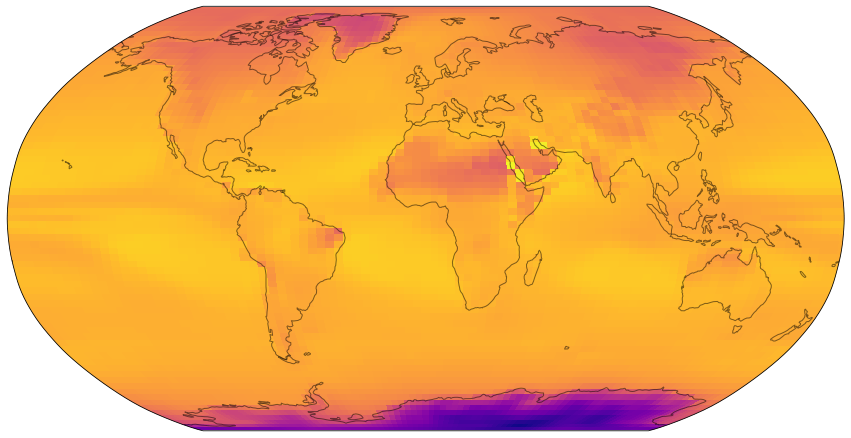

1
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  6
#params :  648261


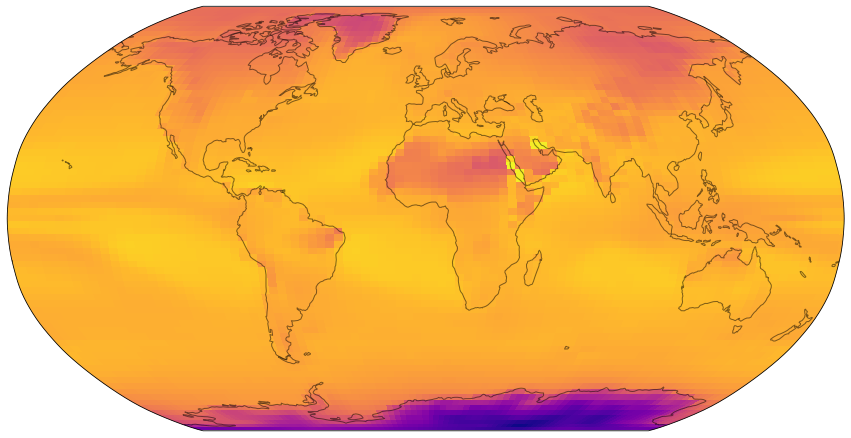

2
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  9
#params :  2288133


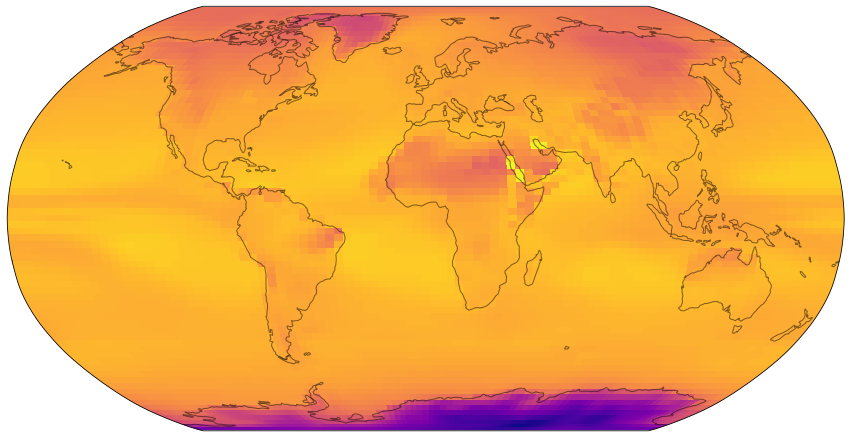

3
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  4
#params :  648261


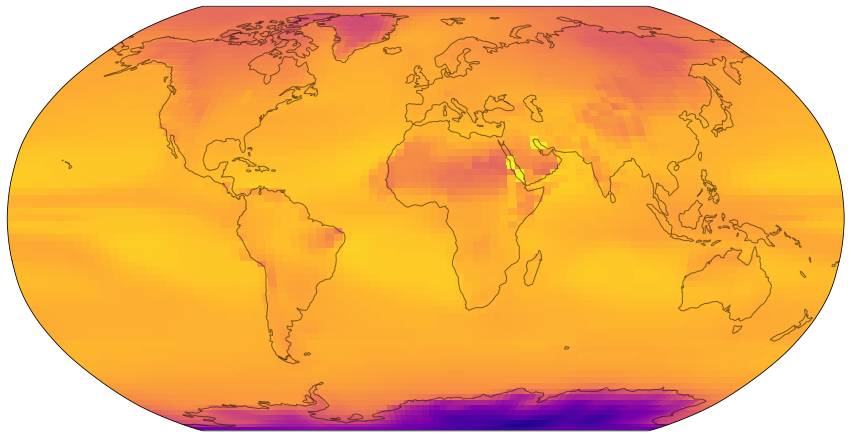

4
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  3
#params :  2288133


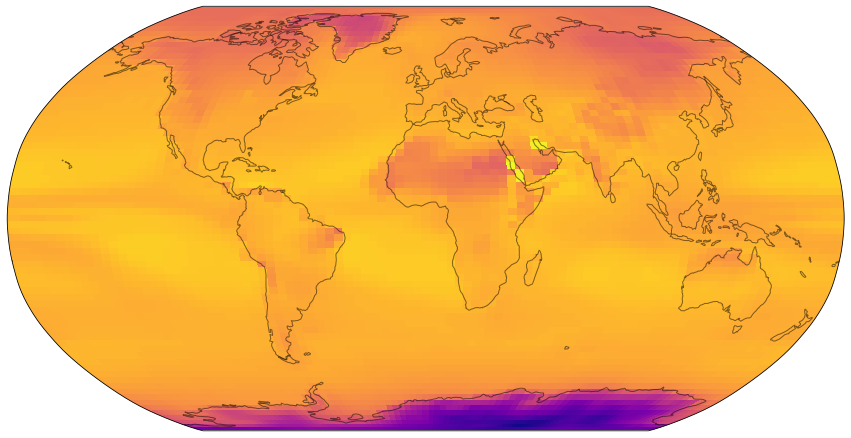

5
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  7
#params :  648261


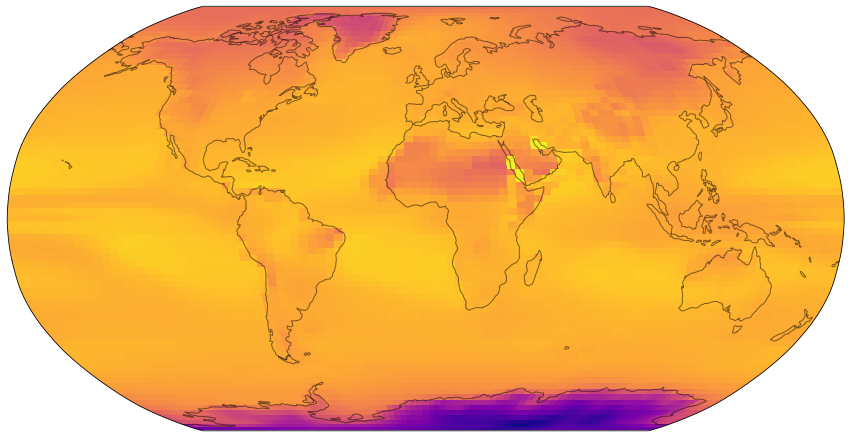

6
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  2
#params :  2288133


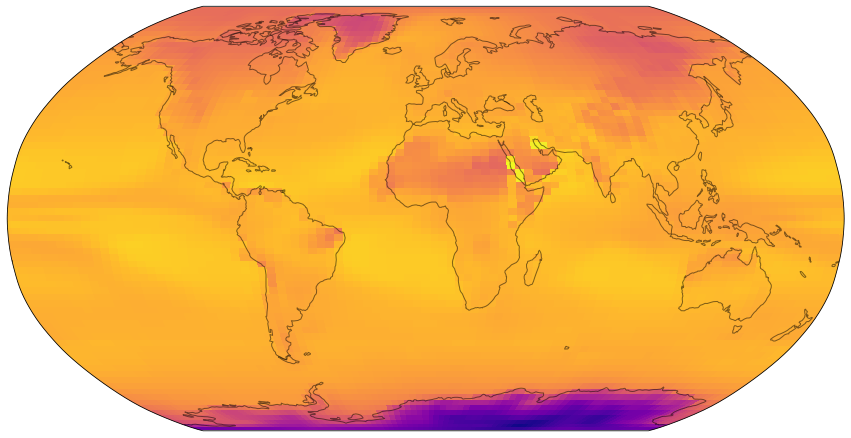

7
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  1
#params :  2288133


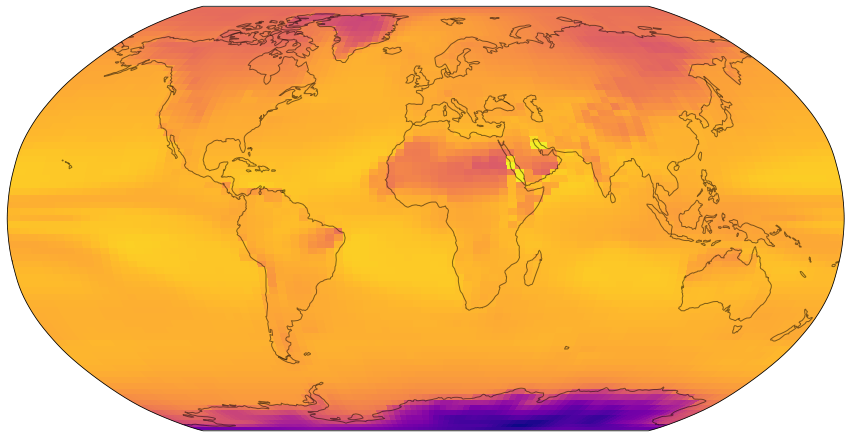

8
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  6
#params :  2549893


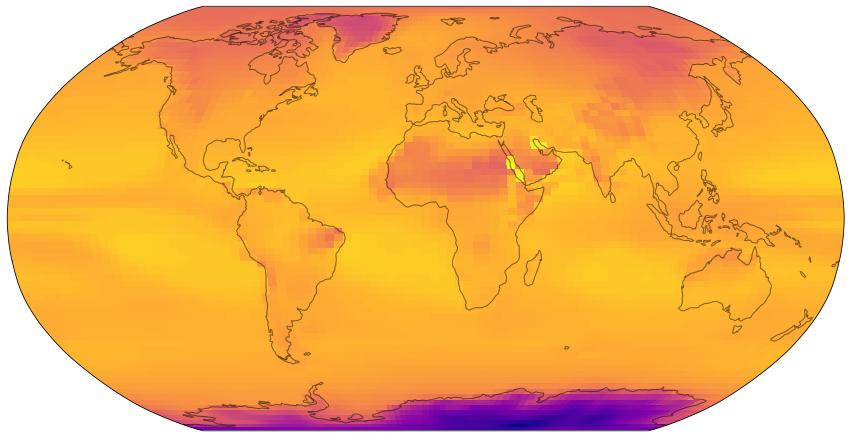

9
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  0
#params :  648261


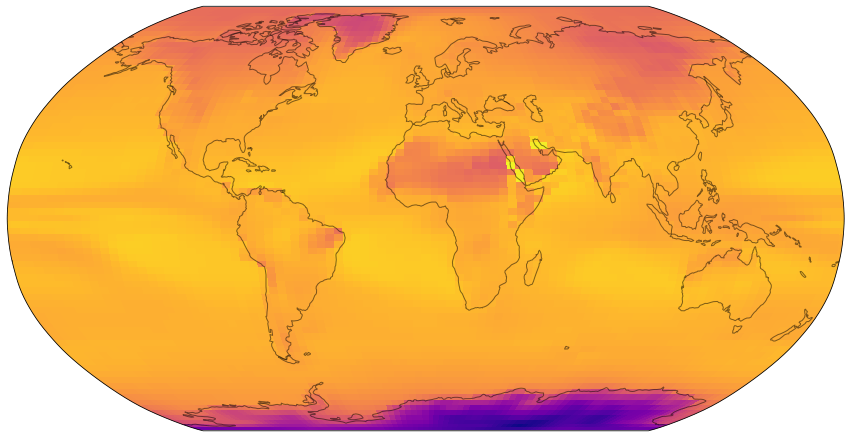

10
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  1
#params :  648261


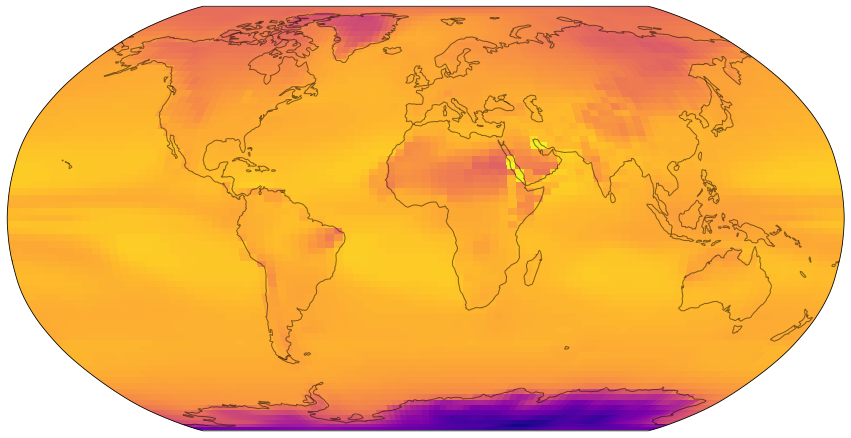

11
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  3
#params :  2549893


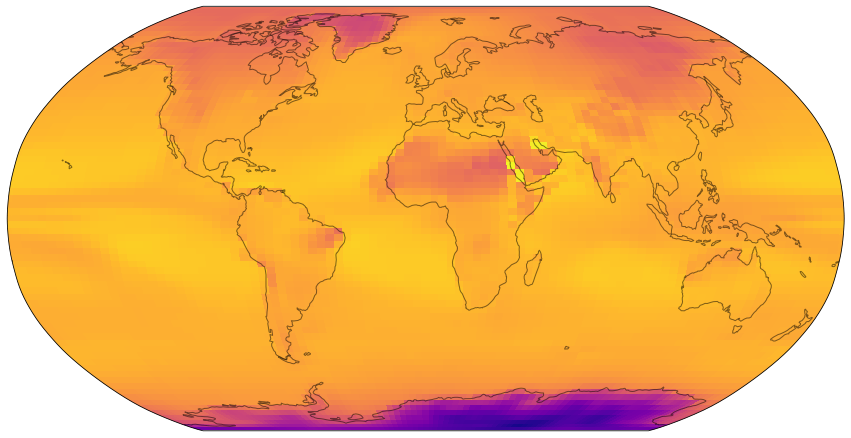

12
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  0
#params :  2549893


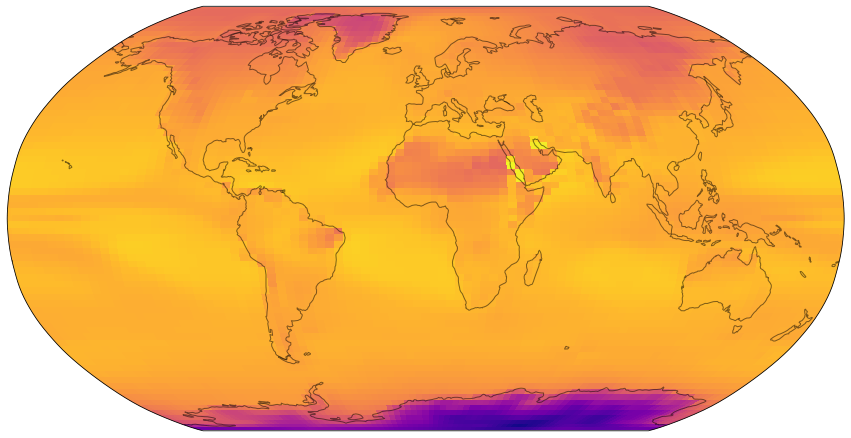

13
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  1
#params :  2549893


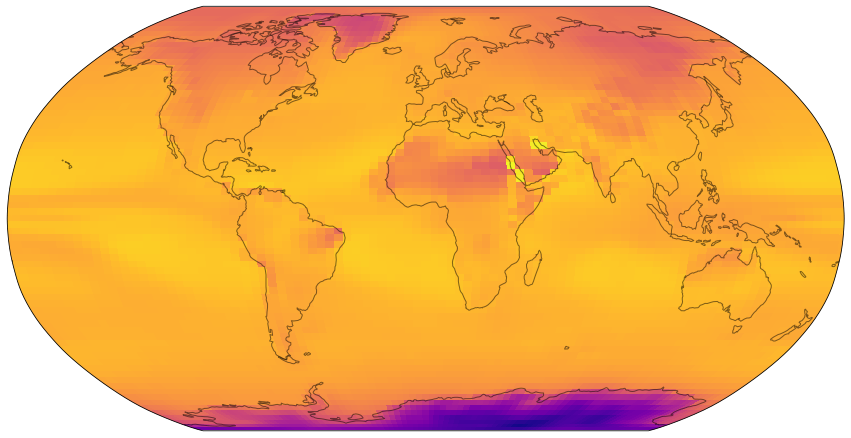

14
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  0
#params :  648261


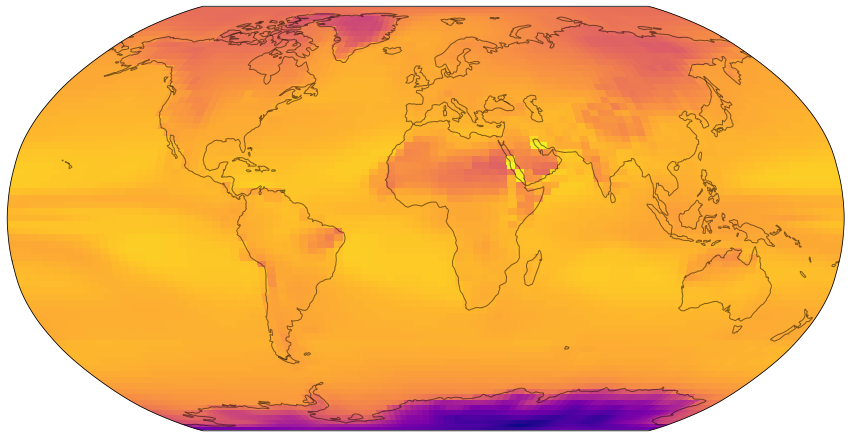

15
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  5
#params :  648261


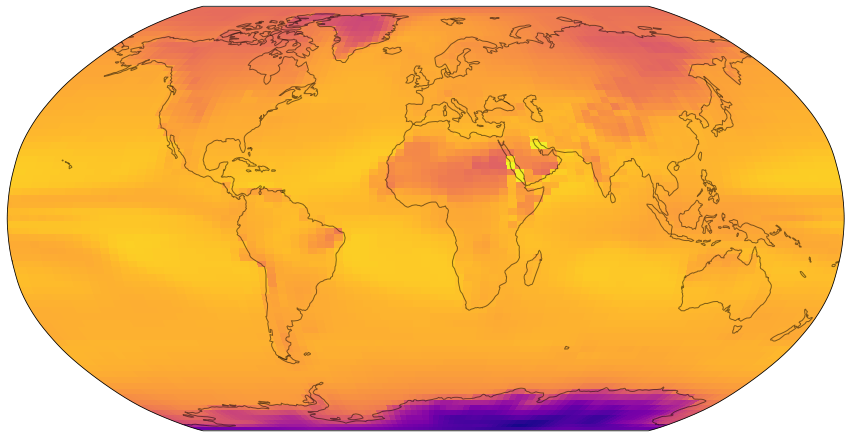

16
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  6
#params :  2288133


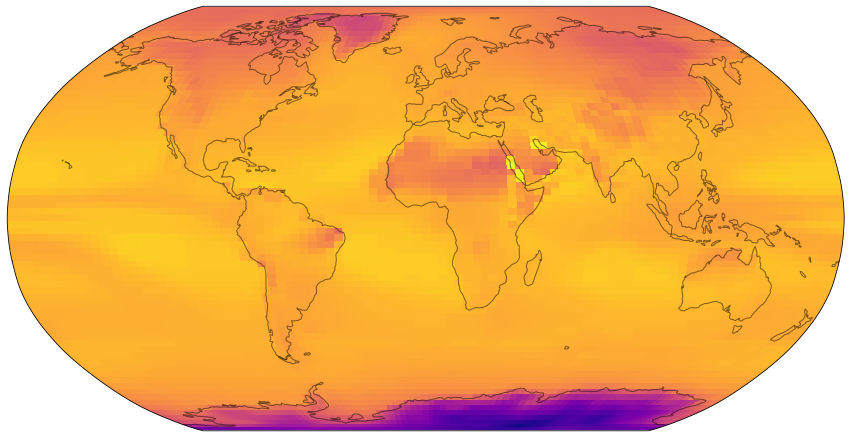

17
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  5
#params :  2549893


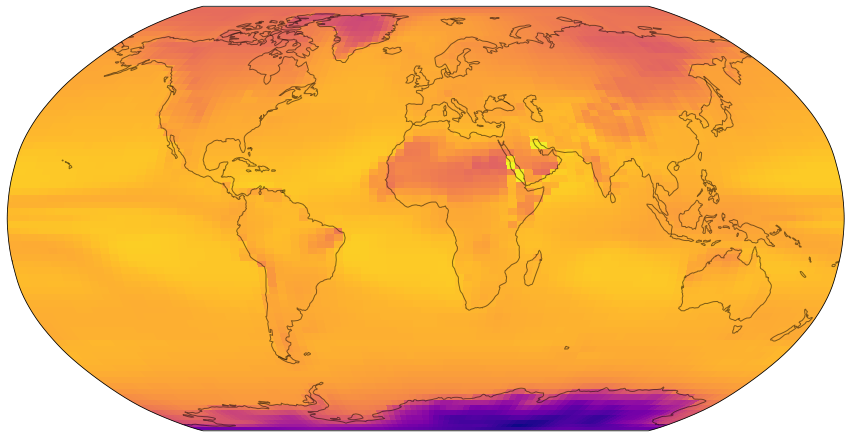

18
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  1
#params :  648261


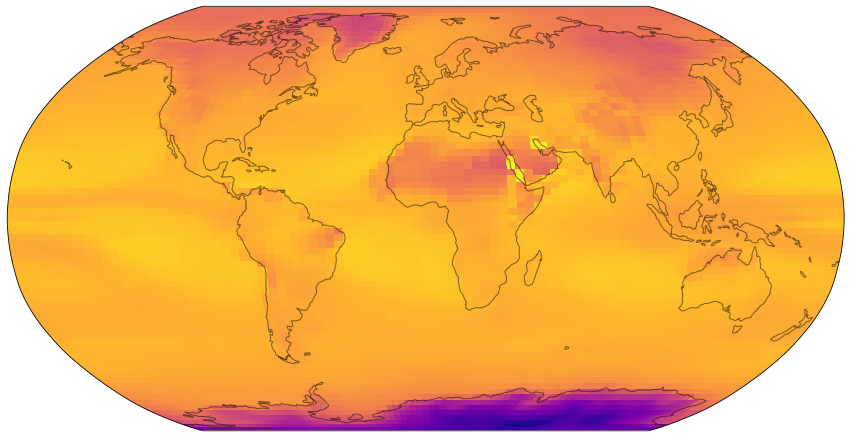

19
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  3
#params :  648261


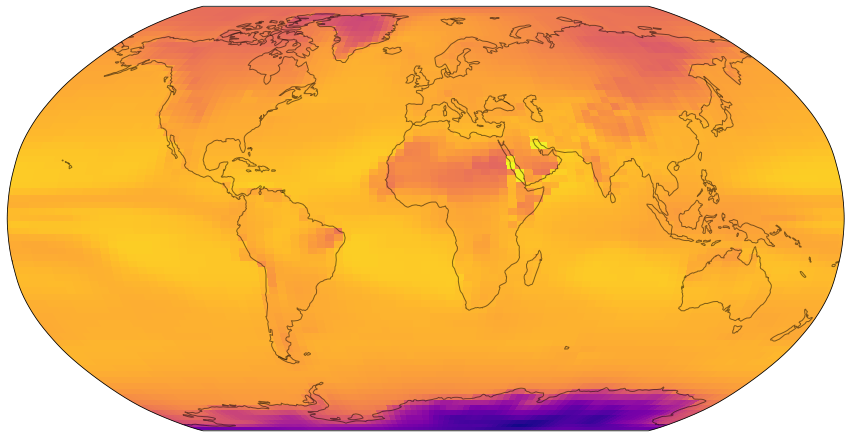

20
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  4
#params :  648261


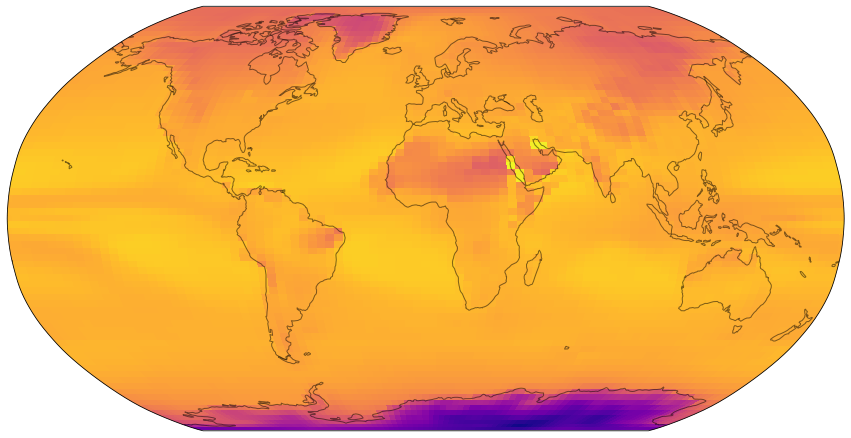

21
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  2
#params :  648261


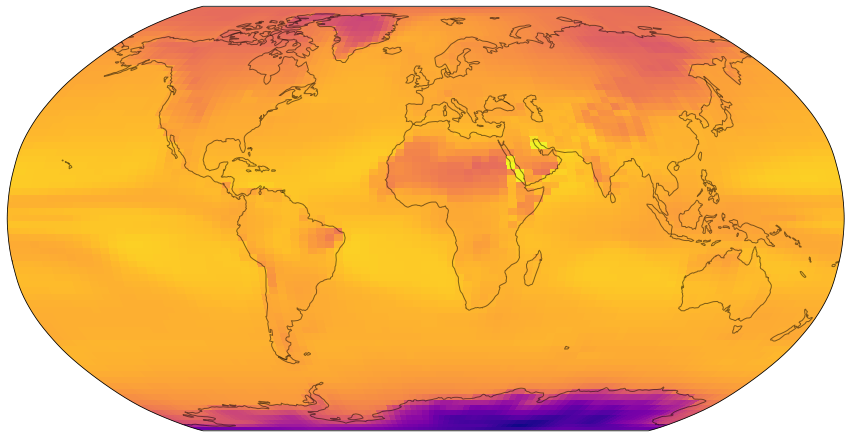

22
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  8
#params :  2288133


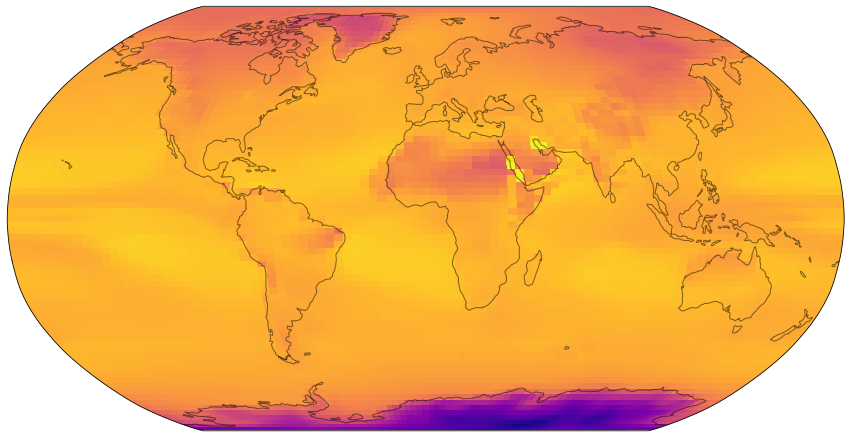

23
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  4
#params :  2549893


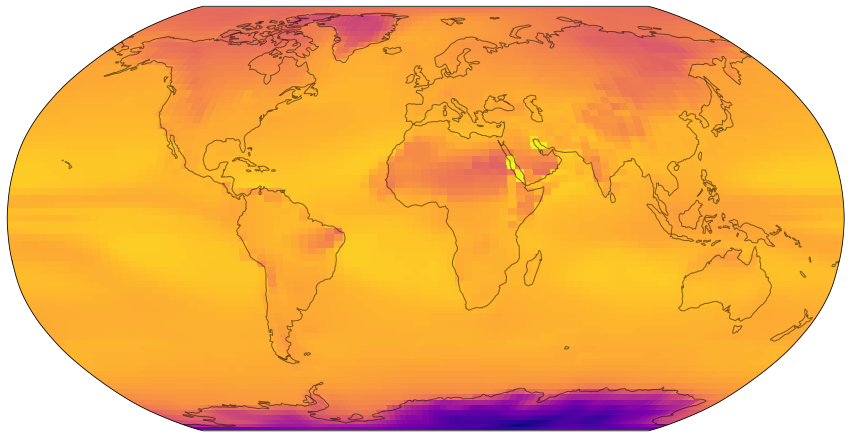

24
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  7
#params :  2549893


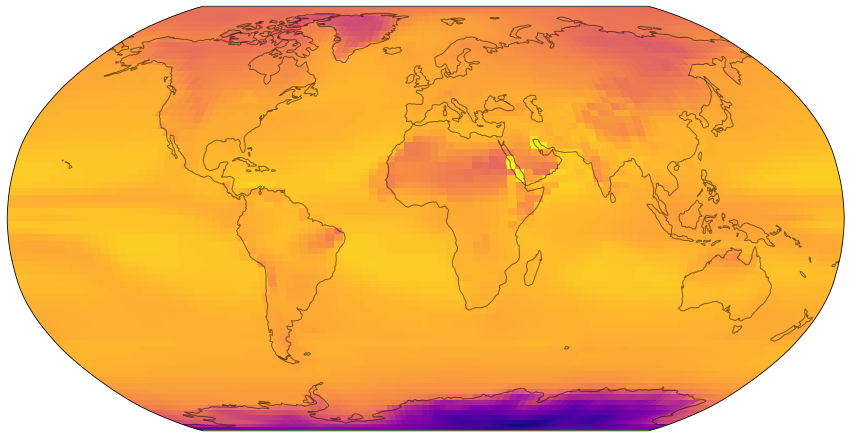

25
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  6
#params :  648261


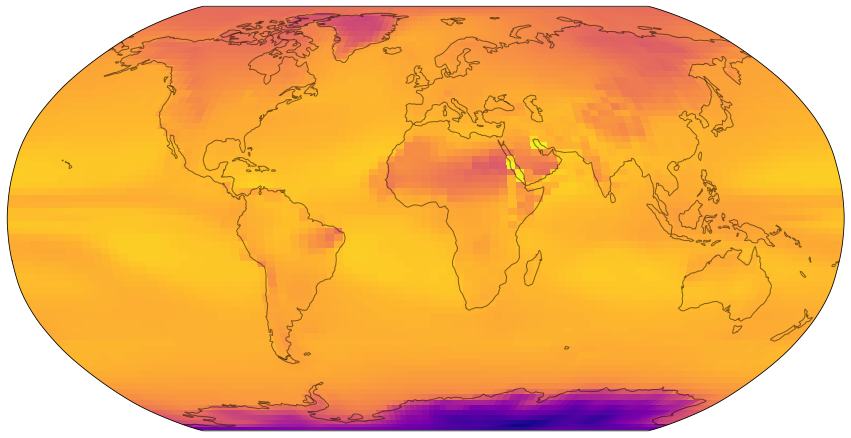

26
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  9
#params :  648261


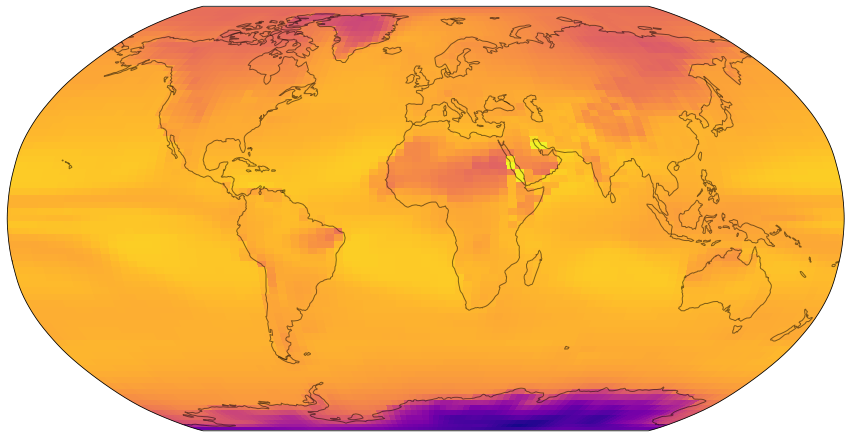

27
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  2
#params :  648261


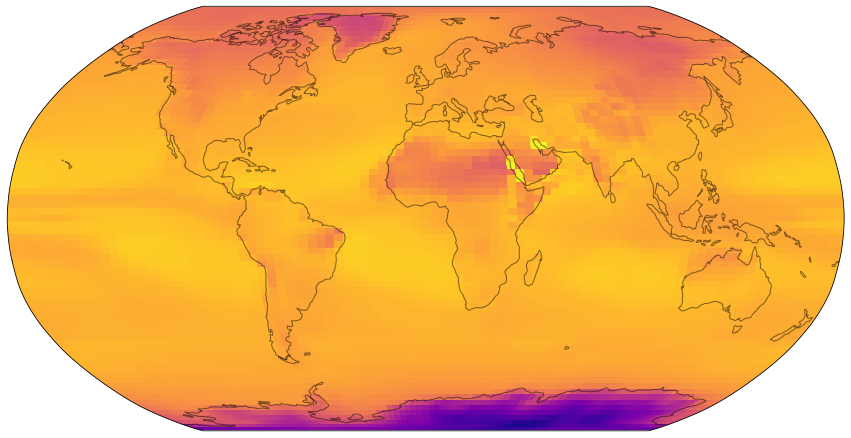

28
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  5
#params :  2288133


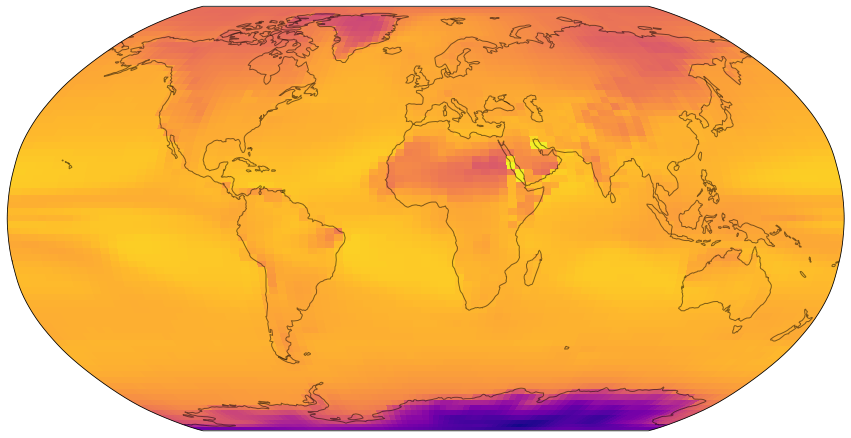

29
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  7
#params :  648261


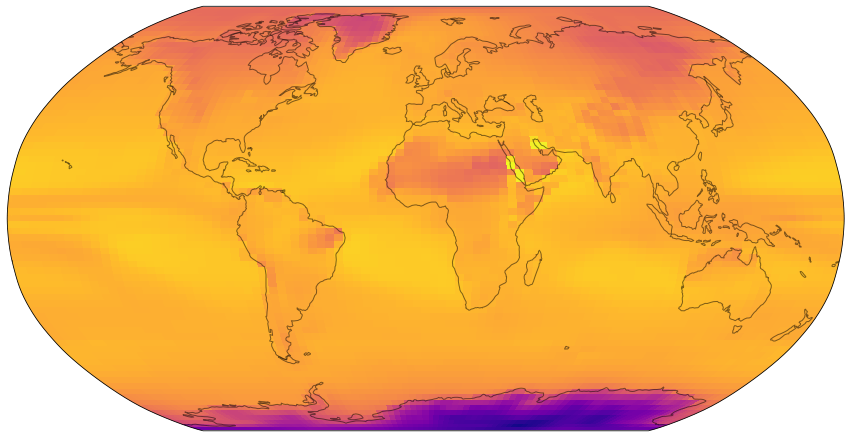

30
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  4
#params :  2288133


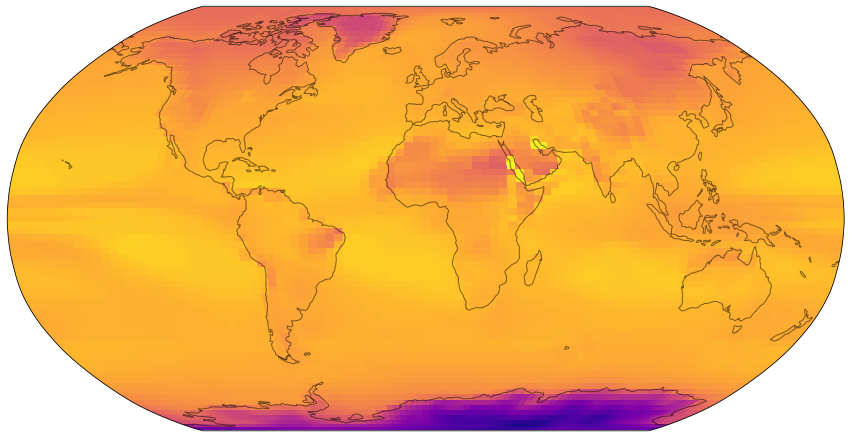

31
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  8
#params :  648261


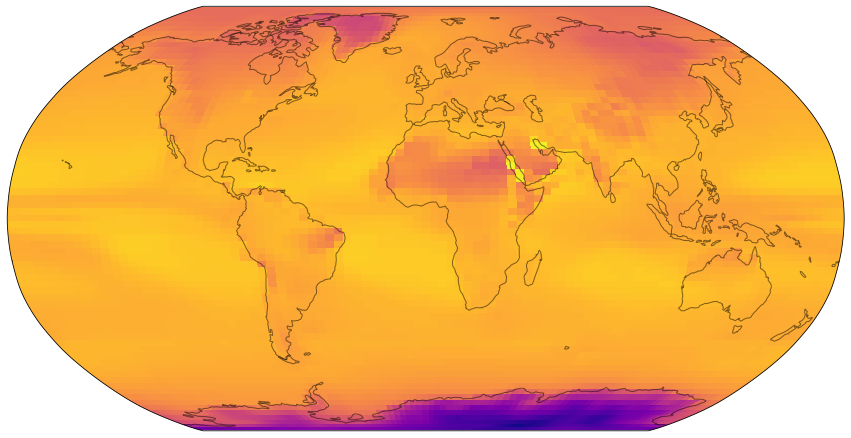

32
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  9
#params :  2549893


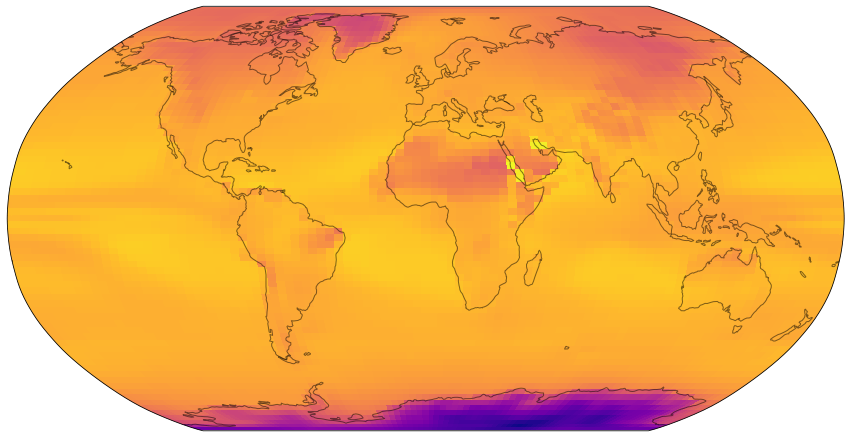

33
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  3
#params :  648261


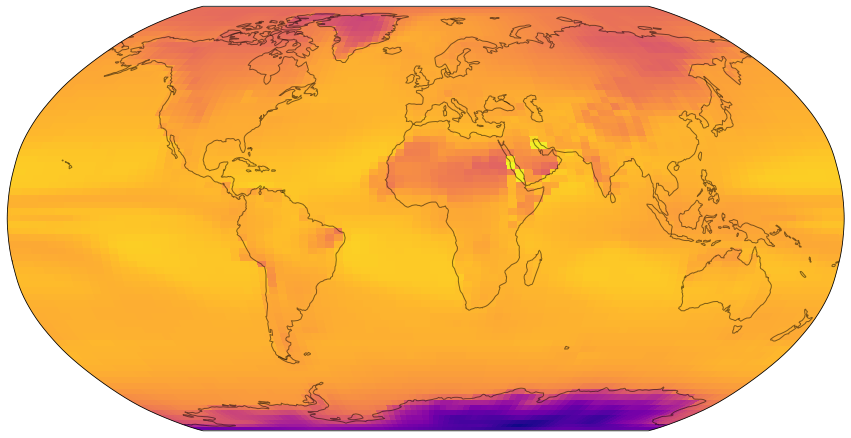

34
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  0
#params :  2288133


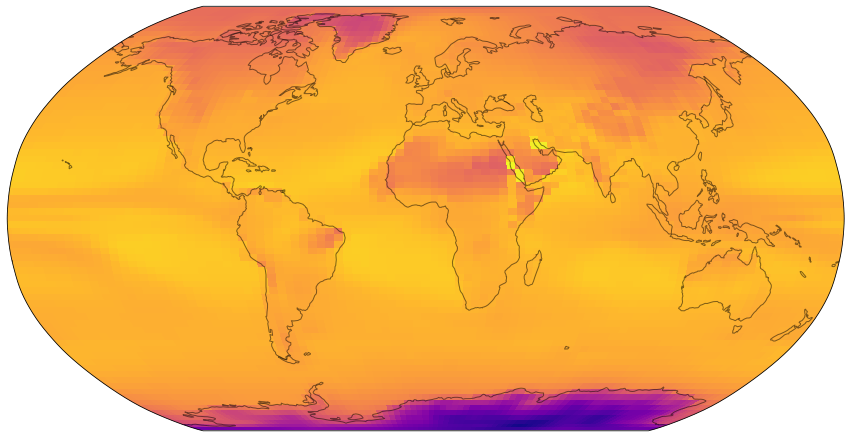

35
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  8
#params :  648261


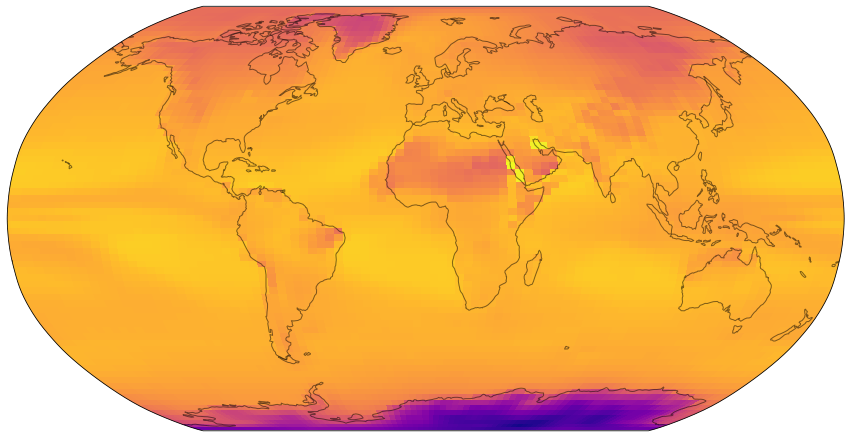

36
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  9
#params :  648261


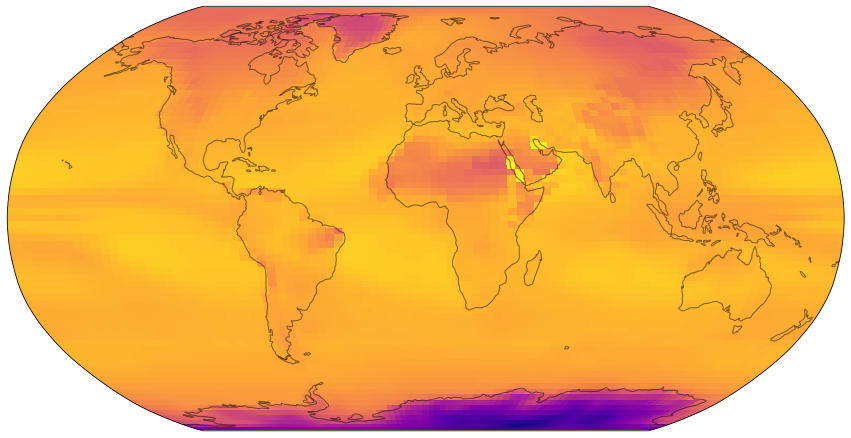

37
MODELTYPE :  UNet_flat_wider
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  64
OUT_CHANNELS :  1
FMAPS :  (64, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  8
#params :  2549893


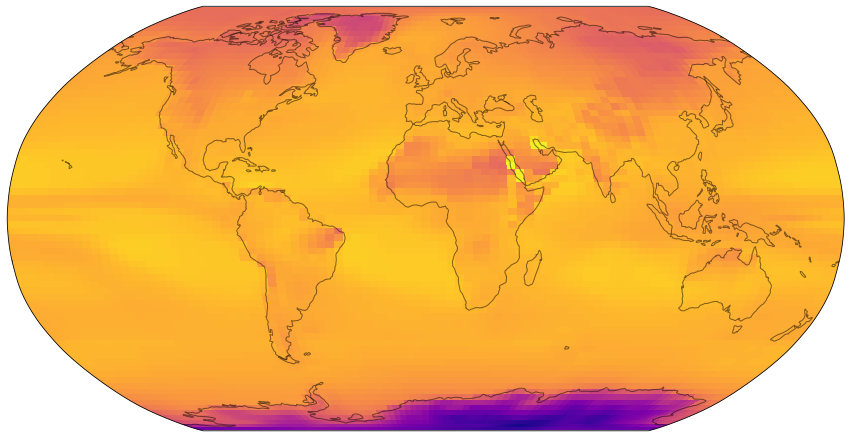

38
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.002637
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  5
#params :  648261


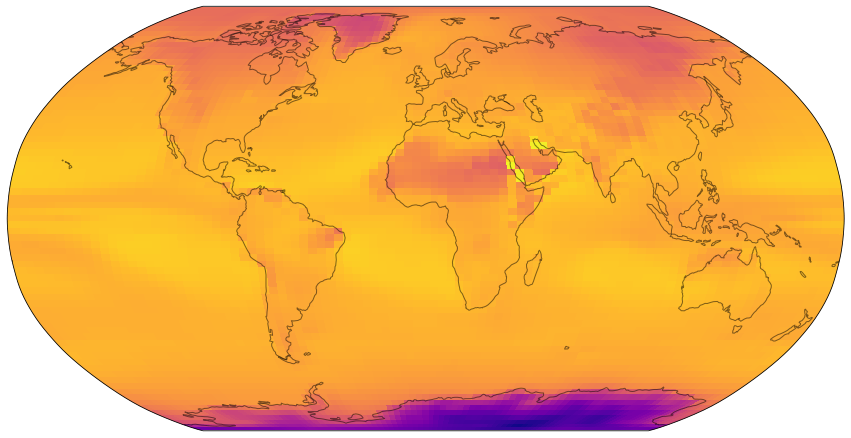

39
MODELTYPE :  UNet_flat_deeper
DEPTH :  4
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 128, 128)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  7
#params :  2288133


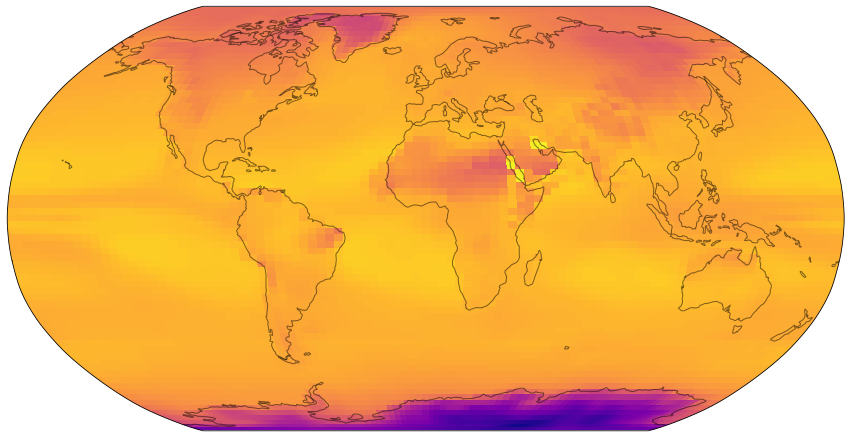

In [30]:
for i, i_j in enumerate(indices_dataset):
    print(i)
    # for key, value in dataset_descriptions[i_j].items():
        # print(key,": ", value)
    for key, value in model_descriptions[i].items():
        print(key,": ", value)
    plot_regular_lattice_map(rescaled_predictions[i][0,0,...], lat[indices_dataset[i]], lon[indices_dataset[i]], norm=norm)

In [31]:
def RMSE(predictions, targets):
    from sklearn.metrics import mean_squared_error
    rmse = np.zeros((predictions.shape[1]))
    for i in range(predictions.shape[1]):
        rmse[i] = mean_squared_error(targets[:,i], predictions[:,i], squared=False)
    return rmse

In [32]:
rmse = []
metric = []
for i in range(len(rescaled_predictions)):
    rmse.append(RMSE(d18O_test[indices_dataset[i]].reshape(d18O_test[indices_dataset[i]].shape[0],-1), \
                     rescaled_predictions[i].reshape(rescaled_predictions[i].shape[0],-1)).reshape(len(lat[indices_dataset[i]]), len(lon[indices_dataset[i]])))

    # compute explained variance by dividing rmse by standard-deviation on test set.
    metric.append(- rmse[-1]/np.std(d18O_test[indices_dataset[i]], axis=0).reshape(len(lat[indices_dataset[i]]), len(lon[indices_dataset[i]])) + 1 )

In [33]:
def plot_explained_variance(metric, lat, lon, figsize=(15,10), cbar_fontsize=15, projection=ccrs.Robinson(), 
                            title="", cbar_label="", norm=None, cmap=None, title_fontsize=15, savename=None, use_default_bounds=True):
    # plot RMSE/sigma - 1
    assert metric.shape == (len(lat), len(lon))
    
    #set up colormap
    colors = ["#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#d1e5f0","#92c5de","#4393c3","#2166ac","#053061"]
    
    if use_default_bounds:
        lim = 1 # math.ceil(np.max(metric))
        bounds = np.concatenate((np.array([-1.0,-0.8,-0.6,-0.4,-0.2]),np.linspace(0, lim, 6)))
    if cmap is None:
        cmap= matplotlib.colors.ListedColormap(colors)
    if norm is None:
        norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
                          
    fig = plt.figure(figsize = figsize)
    ax = fig.add_subplot(1,1,1,projection = projection)
    ax.set_global()
    #remove white line
    field, lon_plot = add_cyclic_point(metric, coord = lon)
    lo, la = np.meshgrid(lon_plot, lat)
    layer = ax.pcolormesh(lo, la, field, transform=ccrs.PlateCarree(), cmap=cmap,norm=norm)
    
    if use_default_bounds:
        cbar = fig.colorbar(
            matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm),
            ticks=bounds,
            spacing='proportional',
            orientation='horizontal',
            label='Discrete intervals, some other units',
        ) 
    else:
        cbar = fig.colorbar(
            matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm),
            spacing='proportional',
            orientation='horizontal',
            label='Discrete intervals, some other units',
        )        
    if cbar_label == "":
        cbar.set_label(r"$R^2$ score", fontsize = cbar_fontsize)
    else:
        cbar.set_label(cbar_label, fontsize = cbar_fontsize)
        
    cbar.ax.tick_params(labelsize=20)
    
    ax.coastlines()

    # calculate the global average metric
    weights = np.tile(np.cos(np.deg2rad(lat))[:,None],len(lon))
    metric_global_av = np.average(metric, weights = weights)
    if title == "":
        ax.set_title(r"(Test-RMSE/$\sigma_{test}) - 1$, " + \
                     "Global area weighted average: {:.3f}".format(metric_global_av), fontsize=title_fontsize)
    else:
        ax.set_title(title, fontsize=title_fontsize)
        
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES+savename)

In [34]:
# for i in range(len(metric)):
    # print(model_descriptions[i]["RUN_NR"])
    # print(model_descriptions[i]["S_MODE_PREDICTORS"])    
    # print(model_descriptions[i]["S_MODE_TARGETS"])
    # print(dataset_descriptions[indices_dataset[i]]["predictor_variables"])
    
    # print(model_descriptions[i]["USE_CYLINDRICAL_PADDING"])
    # print(model_descriptions[i]["USE_COORD_CONV"])
    # print(model_descriptions[i]["loss"])
    # plot_explained_variance(metric[i], lat[indices_dataset[i]],lon[indices_dataset[i]], savename="flat_coord_conv_{}.jpg".format(i))
    # plt.show()

# Calculate averages over many runs

In [35]:
# if things that we want to average are not automatically ordered...

groups = []
indices_groups = []

for i in range(len(model_descriptions)):
    
    matches_group = np.array([model_descriptions[i]["MODELTYPE"]  == model_descriptions[group]["MODELTYPE"] and
                              model_descriptions[i]["LEARNING_RATE"]  == model_descriptions[group]["LEARNING_RATE"]for group in groups])
    """
    matches_group = np.array([dataset_descriptions[indices_dataset[i]]["DO_SHUFFLE"] and dataset_descriptions[indices_dataset[group]]["DO_SHUFFLE"] and \
                              dataset_descriptions[indices_dataset[i]]["DSET_NB"] and dataset_descriptions[indices_dataset[group]]["DSET_NB"]])
    """    
    if matches_group.any():
        indices_groups[np.where(matches_group == True)[0][0]].append(i)
        
    else:
        groups.append(i)
        indices_groups.append([])
        indices_groups[-1].append(i)
        
av_metric = np.zeros((len(groups),*metric[0].shape))
global_mean = np.zeros(len(groups))
global_std = np.zeros(len(groups))
# calculate global means and their standard deviations
for i in range(len(groups)):
    l = len(indices_groups[i])
    group_data = np.zeros((l, *metric[0].shape))
    for j, i_g in enumerate(indices_groups[i]):
        group_data[j] = metric[i_g]
    av_metric[i] = np.average(group_data, axis=0)
    
    weights = np.repeat(np.tile(np.cos(np.deg2rad(lat[0]))[:,None],len(lon[0]))[np.newaxis,...], repeats=l, axis=0)
    global_av_metric = np.average(group_data, weights = weights, axis=(1,2))
    global_mean[i] = np.mean(global_av_metric)
    global_std[i] = np.std(global_av_metric)

In [36]:
# Best architecture: UNet_deeper has index 2.
i_best = 2
best_metric = av_metric[i_best]
best_global_mean = global_mean[i_best]
best_global_std = global_std[i_best]

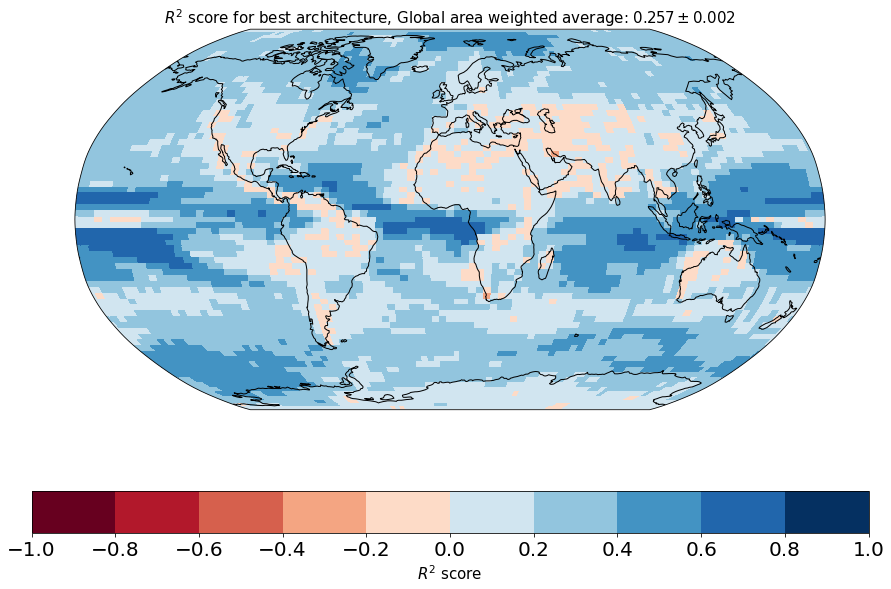

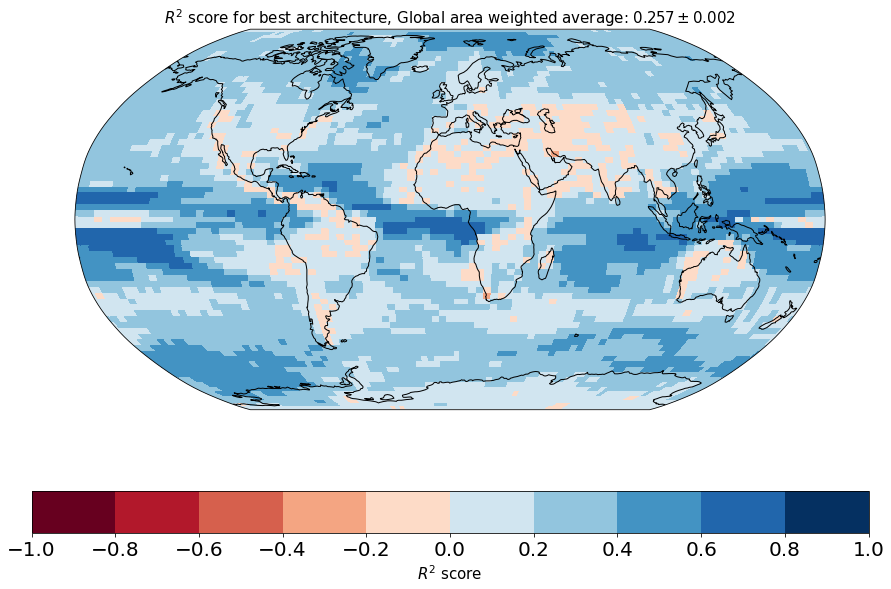

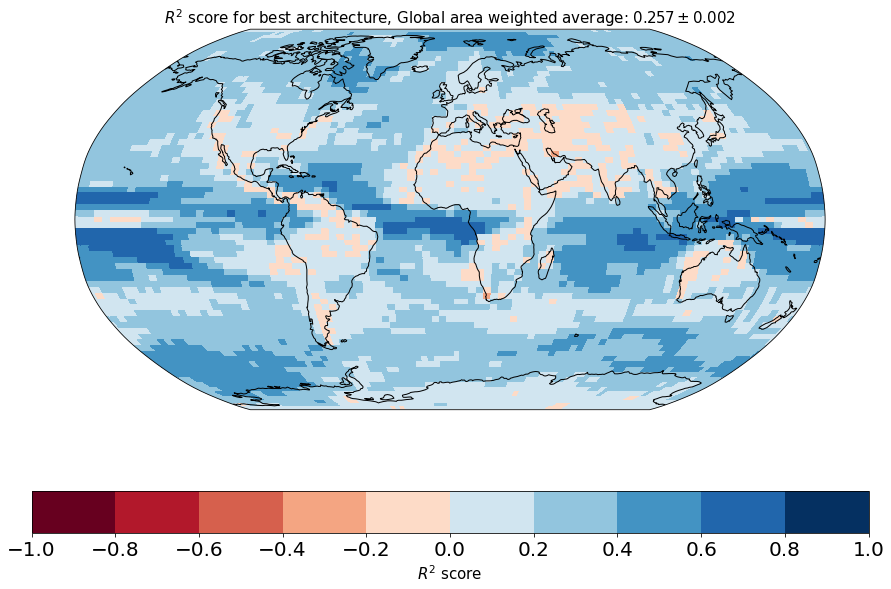

In [38]:
plot_explained_variance(best_metric, lat[indices_dataset[groups[i_best]]],lon[indices_dataset[groups[i_best]]], title=r"$R^2$ score for best architecture, Global area weighted average: ${:.3f} \pm {:.3f}$".format(best_global_mean, best_global_std), savename="best_architecture_yearly.jpg".format(i))
plot_explained_variance(best_metric, lat[indices_dataset[groups[i_best]]],lon[indices_dataset[groups[i_best]]], title=r"$R^2$ score for best architecture, Global area weighted average: ${:.3f} \pm {:.3f}$".format(best_global_mean, best_global_std), savename="best_architecture_yearly.png".format(i))
plot_explained_variance(best_metric, lat[indices_dataset[groups[i_best]]],lon[indices_dataset[groups[i_best]]], title=r"$R^2$ score for best architecture, Global area weighted average: ${:.3f} \pm {:.3f}$".format(best_global_mean, best_global_std), savename="best_architecture_yearly.pdf".format(i))

# Next we want to have a look at some of the predictions.

In [39]:
gt = np.stack(d18O_test,axis=1).reshape(-1, len(lat[0]), len(lon[0]))

pred = np.squeeze([rescaled_predictions[i] for i in np.array(indices_groups[i_best],"int")])

In [40]:
def compare_anomalies_for_snapshots(gt, pred, lat, lon, indices=None, figsize=(15,10),cmap=None, projection=ccrs.Robinson(),
                                    savename=None):
    """
    for some random indices, compare the anomalies from the nanmean (in time) of gt and predictions.
    Assume gt, predictions to have equal shape, (time, lat, lon)
    """
    if indices is not None:
        n_plots = len(indices)
        n_x = n_plots
        n_y = 2
    else:
        n_x = 4
        n_y = 2
        n_plots = n_x * n_y
        indices = np.random.randint(0, gt.shape[0], n_x)
    
    if cmap is None:
        cmap = matplotlib.pyplot.get_cmap("RdBu").copy()
    gt_mean = np.nanmean(gt, axis=0, keepdims=True)
    # select the images we want to work on and take anomalies
    gt_anom = gt[indices] - gt_mean
    pred_anom = pred[indices] - gt_mean
    
    vmax = 2# max(np.nanmax(abs(gt_anom)), np.nanmax(abs(pred_anom)))
    vmin = -2 #-vmax
    norm = matplotlib.colors.Normalize(vmin, vmax)
    
    fig = plt.figure(figsize=figsize)
    
    for i in range(0,n_x):
        #remove white line
        ax = plt.subplot(2, n_x, i+1, projection=projection)
        ax.set_title("GT, random timestep")
        ax2 = plt.subplot(2, n_x, n_x+i+1, projection=projection)
        ax2.set_title("Pred, random timestep")
        
        field_gt, lon_gt_plot = add_cyclic_point(gt_anom[i], coord = lon)
        field_pred, lon_pred_plot = add_cyclic_point(pred_anom[i], coord = lon)
        lo_gt, la_gt = np.meshgrid(lon_gt_plot, lat)
        lo_pred, la_pred = np.meshgrid(lon_pred_plot, lat)
        layer_gt = ax.pcolormesh(lo_gt, la_gt, field_gt, transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
        ax.coastlines()                
        layer_pred = ax2.pcolormesh(lo_pred, la_pred, field_pred, transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
        ax2.coastlines() 
        
    fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,wspace=0.08, hspace=0.08)
    
    axb = fig.add_axes([0.83, 0.1, 0.02, 0.8])
    cb = matplotlib.colorbar.ColorbarBase(axb, orientation='vertical', cmap=cmap, norm=norm, label="${}^{18}\delta(O)$ anomaly [‰]", extend="both")
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES + savename)
    plt.show()

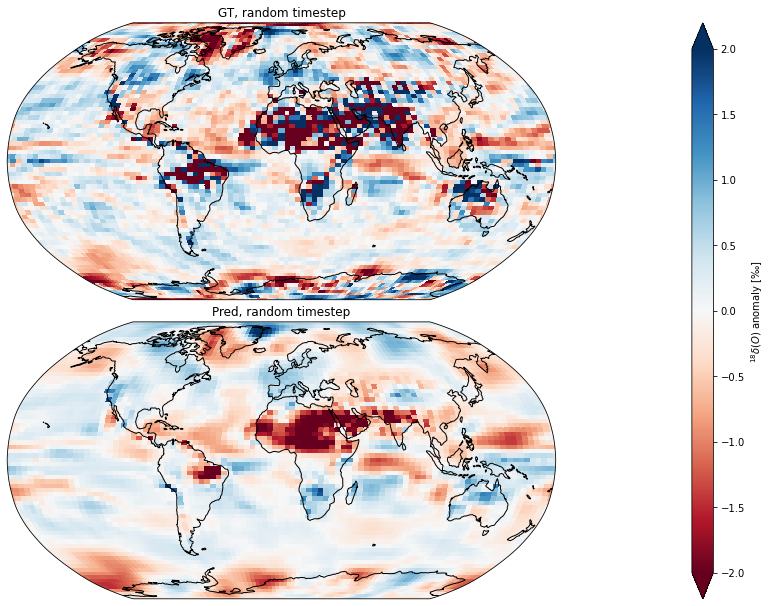

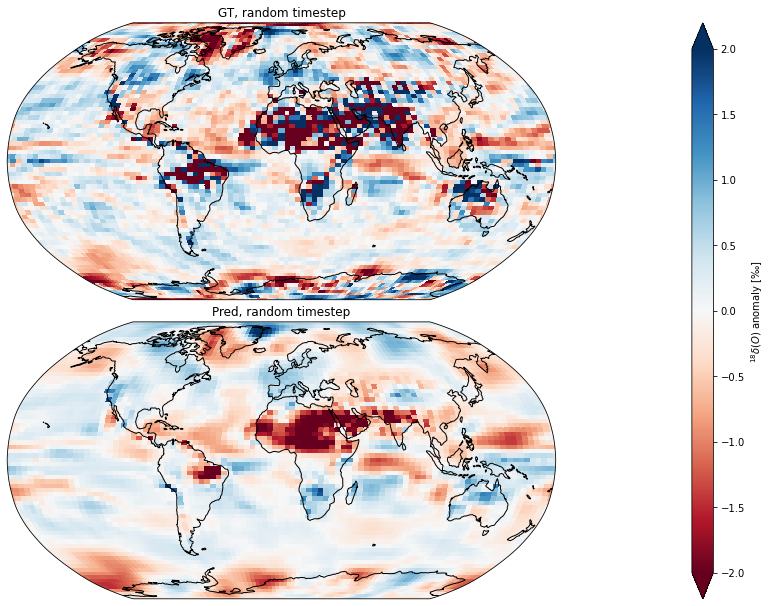

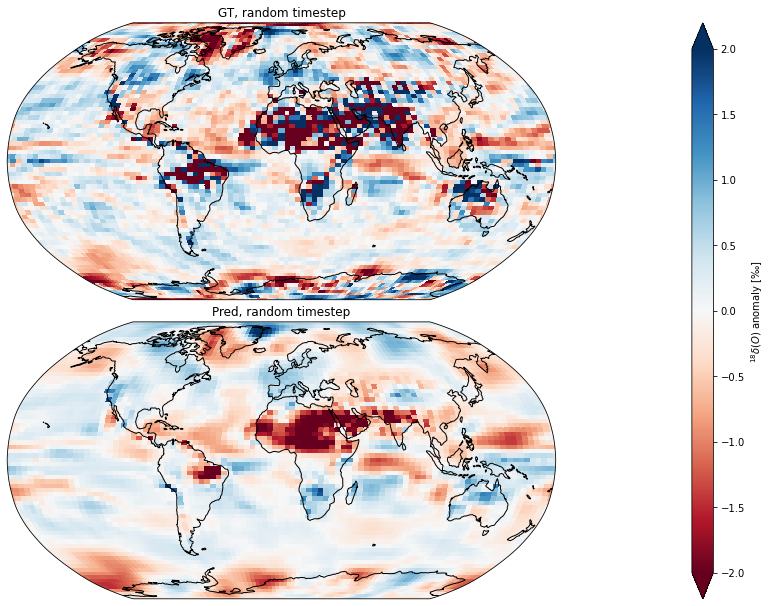

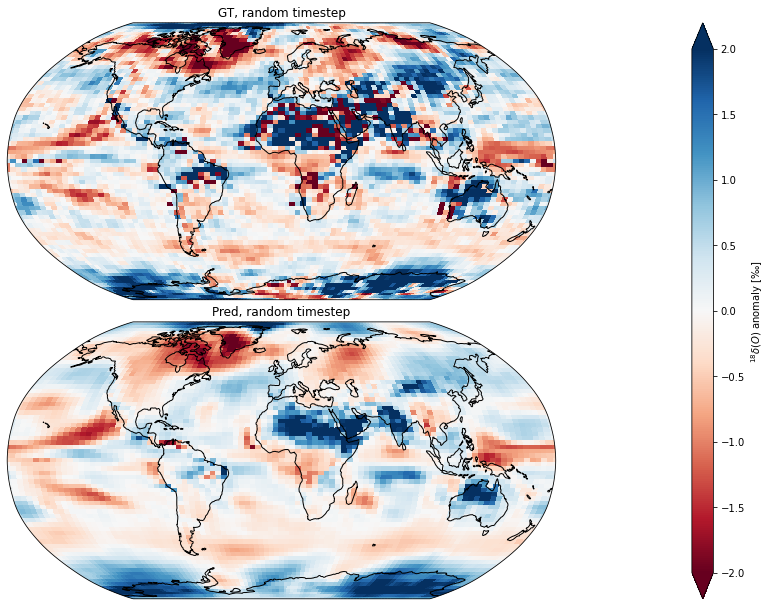

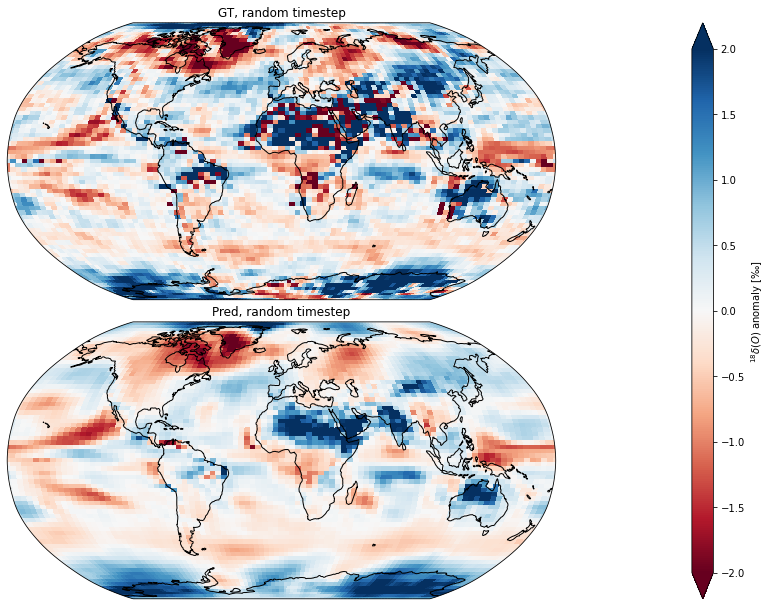

...

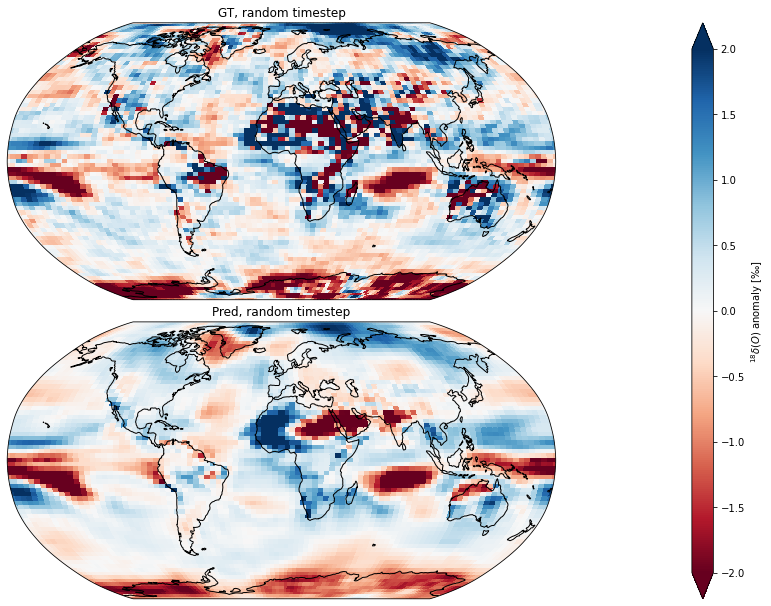

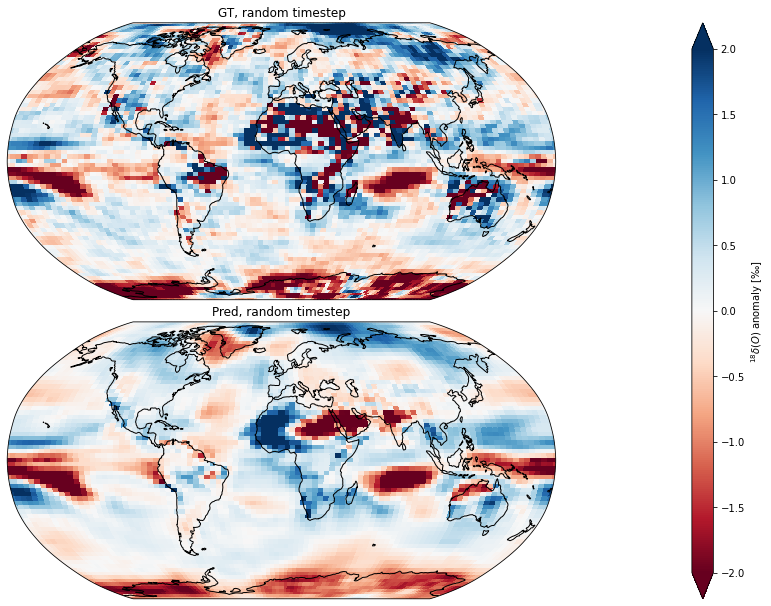

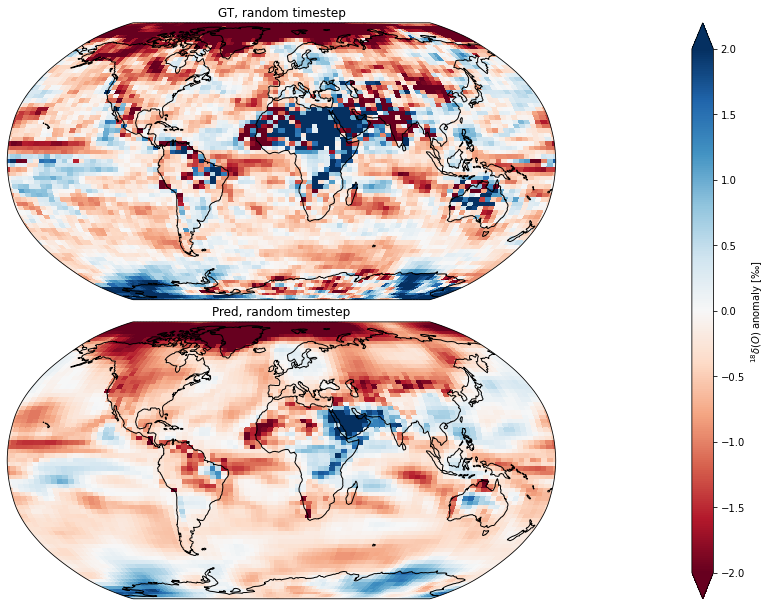

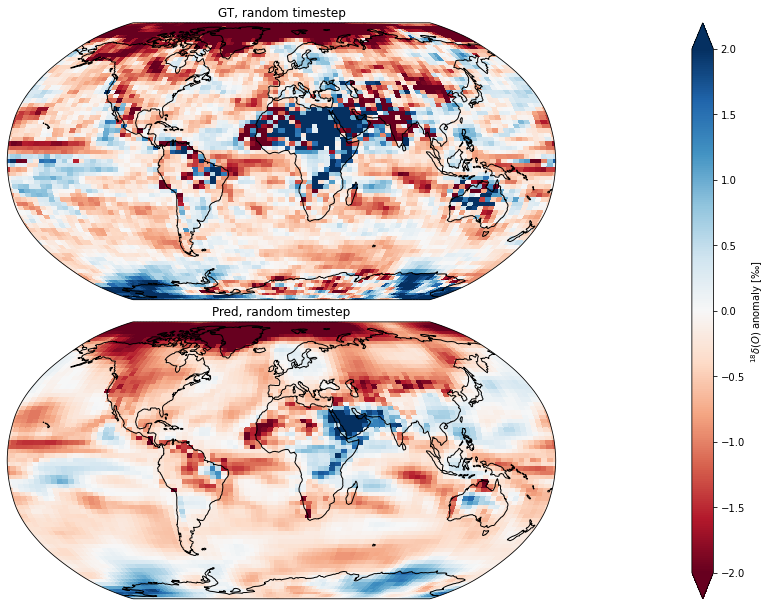

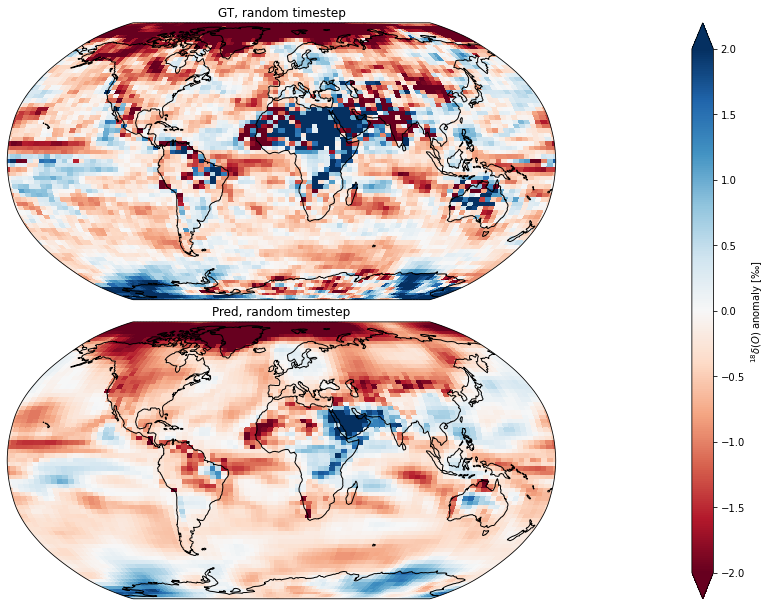

In [41]:
indices = np.random.choice(np.arange(100),5)
for i in range(5):
    compare_anomalies_for_snapshots(gt[...], np.mean(pred[...],axis=0), lat[indices_dataset[groups[i_best]]], lon[indices_dataset[groups[i_best]]], indices=indices[i:i+1], savename="best_anomalies_{}.jpg".format(i))
    compare_anomalies_for_snapshots(gt[...], np.mean(pred[...],axis=0), lat[indices_dataset[groups[i_best]]], lon[indices_dataset[groups[i_best]]], indices=indices[i:i+1], savename="best_anomalies_{}.png".format(i))
    compare_anomalies_for_snapshots(gt[...], np.mean(pred[...],axis=0), lat[indices_dataset[groups[i_best]]], lon[indices_dataset[groups[i_best]]], indices=indices[i:i+1], savename="best_anomalies_{}.pdf".format(i))

# timeseries for fixed positions

In [42]:
rescaled_predictions

[array([[[[-18.79470626, -18.8320133 , -18.81764326, ..., -18.13928096,
           -18.31937954, -18.57649327],
          [-16.92203477, -16.72983115, -16.49487677, ..., -17.001004  ,
           -16.95253012, -17.00217912],
          [-14.51749217, -14.0187752 , -13.59359913, ..., -15.77555899,
           -15.44831555, -15.04161662],
          ...,
          [-52.25263855, -54.11274241, -56.10048345, ..., -50.55908947,
           -51.09686335, -51.39379893],
          [-55.10514883, -56.1504084 , -57.4968149 , ..., -53.06924583,
           -53.6684135 , -54.33993754],
          [-57.49250007, -58.15623889, -58.88110899, ..., -55.58109015,
           -56.10949588, -56.8315503 ]]],
 
 
        [[[-17.48716715, -17.57456075, -17.61154568, ..., -16.67834803,
           -16.91329714, -17.19139737],
          [-15.183073  , -15.21259507, -15.18064296, ..., -15.05773933,
           -14.99480848, -15.06751008],
          [-12.94271554, -12.81369958, -12.75360104, ..., -13.97886331,
           

In [43]:
gt_timeseries = np.squeeze(d18O_test[0])
pred_timeseries = np.squeeze([rescaled_predictions[i] for i in np.array(indices_groups[i_best],"int")])

In [44]:
def cor_fields(f1, f2):
    """Calculate pearson correlation coefficient for temporal correlation of 2 spatiotemporal fields"""
    from scipy.stats import pearsonr 
    pearson_correlation = np.zeros((f1.shape[1],f1.shape[2]))
    for i in range(f1.shape[1]):
        for j in range(f1.shape[2]):
            nas = np.logical_or(np.isnan(f1[:,i,j]), np.isnan(f2[:,i,j]))
            pearson_correlation[i,j] = pearsonr(f1[~nas,i,j],f2[~nas,i,j])[0]
    return pearson_correlation

In [45]:
def plot_timeseries(lat, lon, lat_array, lon_array, gt_timeseries, pred_timeseries,\
                    figsize=(14,9), xlims=None,savename=None):
    """
    For a given latitude and longitude plot the testset-timeseries at the closest gridbox.
    Mark missing values.
    
    Assume that the timeseries are in format (time, lat, lon).
    """
    lon = lon%360
    # get indices of closest box
    assert -90 <= lat <= 90
    
    assert len(pred_timeseries.shape) == 3 or len(pred_timeseries.shape) == 4 
    assert len(gt_timeseries.shape) == 3
    
    i_lat = (np.abs(lat_array - lat)).argmin()
    i_lon = (np.abs(lon_array - lon)).argmin()
    
    fig, ax = plt.subplots(figsize=figsize)
    
    fig.suptitle("Compare timeseries of prediction and groundtruth at {:.1f} lat., {:.1f} lon.".format(lat_array[i_lat], lon_array[i_lon]), fontsize=20)
    
    ax.plot(gt_timeseries[:,i_lat, i_lon], label='ground truth',color='k')
    if len(pred_timeseries.shape) == 4:
        metric = np.zeros((pred_timeseries.shape[0], len(lat_array), len(lon_array)))
        cor = np.zeros((pred_timeseries.shape[0], len(lat_array), len(lon_array)))
        
        for i in range(pred_timeseries.shape[0]):
            metric[i] = 1 - RMSE(gt_timeseries.reshape(gt_timeseries.shape[0],-1), \
                                 pred_timeseries[i].reshape(pred_timeseries[i].shape[0],-1)).reshape(len(lat_array), len(lon_array))/np.nanstd(gt_timeseries, axis=0, keepdims=True)
            metric[i] = np.squeeze(metric[i])
            cor[i] = cor_fields(pred_timeseries[i,...], gt_timeseries) 
            
        max_pred = np.amax(pred_timeseries, axis=0)
        min_pred = np.amin(pred_timeseries, axis=0)
        mean_pred = np.mean(pred_timeseries, axis=0)
        
        ax.plot(mean_pred[:,i_lat, i_lon], label='prediction, average', color="g")     
        ax.fill_between(np.arange(len(mean_pred[:,i_lat, i_lon])), min_pred[:,i_lat, i_lon], max_pred[:,i_lat, i_lon],\
                        label='min-max prediction', color="g", alpha=0.5)     
        metric_mean = np.mean(metric, axis=0)
        metric_std = np.std(metric, axis=0)
        cor_mean = np.mean(cor, axis=0)   
        cor_std = np.std(cor, axis=0)    
        
        ax.text(5, np.mean(pred_timeseries[...,i_lat, i_lon]) , "Cor: {:0.2f} +/- {:0.2f}, metric: {:0.2f} +/- {:0.2f}".format(cor_mean[i_lat, i_lon], cor_std[i_lat, i_lon], metric_mean[i_lat, i_lon], metric_std[i_lat, i_lon]), style='italic', fontsize=12,bbox={'facecolor': 'white', 'alpha': 1.0, 'pad': 10})
    else:
        ax.plot(pred_timeseries[:,i_lat, i_lon], label='prediction, av', color="g")  
        metric = 1 - RMSE(gt_timeseries.reshape(gt_timeseries.shape[0],-1), \
                          pred_timeseries.reshape(pred_timeseries.shape[0],-1)).reshape(len(lat_array), len(lon_array))/np.nanstd(gt_timeseries, axis=0, keepdims=True)
        metric = np.squeeze(metric)
        cor = cor_fields(pred_timeseries, gt_timeseries) 

        ax.text(5, np.mean(pred_timeseries[...,i_lat, i_lon]) , "Cor: {:0.2f}, metric: {:0.2f}".format(cor[i_lat, i_lon], metric[i_lat, i_lon]), style='italic', fontsize=12,
                 bbox={'facecolor': 'white', 'alpha': 1.0, 'pad': 10})
    if xlims is not None:
        plt.xlim(xlims)
    plt.legend(loc="upper right")
    plt.xlabel("timestep in test set")
    plt.ylabel(r"${}^{18}\delta(O)$ [permille]")    
    axins = inset_axes(ax, width="40%", height="40%", loc="lower right", 
                   axes_class=cartopy.mpl.geoaxes.GeoAxes, 
                   axes_kwargs=dict(map_projection=cartopy.crs.PlateCarree()))
    axins.set_extent((-180, 180, -90, 90), cartopy.crs.PlateCarree())
    #need weird trafo's because for some reasons coordinates reach from -180,180
    axins.plot((lon_array[i_lon]+180)%360-180, lat_array[i_lat],marker="*", color='g')
    axins.add_feature(cartopy.feature.COASTLINE)
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES + savename)        
    plt.show()
    plt.close()

In [46]:
def plot_timeseries_without_inset(lat, lon, lat_array, lon_array, gt_timeseries, pred_timeseries,\
                    figsize=(12,7), xlims=None,savename=None):
    """
    For a given latitude and longitude plot the testset-timeseries at the closest gridbox.
    Mark missing values.
    
    Assume that the timeseries are in format (time, lat, lon).
    """
    lon = lon%360
    # get indices of closest box
    assert -90 <= lat <= 90
    
    assert len(pred_timeseries.shape) == 3 or len(pred_timeseries.shape) == 4 
    assert len(gt_timeseries.shape) == 3
    
    i_lat = (np.abs(lat_array - lat)).argmin()
    i_lon = (np.abs(lon_array - lon)).argmin()
    print(i_lat, i_lon)
    fig, ax = plt.subplots(figsize=figsize)
    
    fig.suptitle("Compare timeseries of prediction and groundtruth at {:.1f} lat., {:.1f} lon.".format(lat_array[i_lat], lon_array[i_lon]), fontsize=15)
    
    ax.plot(gt_timeseries[:,i_lat, i_lon], label='ground truth',color='k')
    if len(pred_timeseries.shape) == 4:
        metric = np.zeros((pred_timeseries.shape[0], len(lat_array), len(lon_array)))
        cor = np.zeros((pred_timeseries.shape[0], len(lat_array), len(lon_array)))
        
        for i in range(pred_timeseries.shape[0]):
            metric[i] = 1 - RMSE(gt_timeseries.reshape(gt_timeseries.shape[0],-1), \
                                 pred_timeseries[i].reshape(pred_timeseries[i].shape[0],-1)).reshape(len(lat_array), len(lon_array))/np.nanstd(gt_timeseries, axis=0, keepdims=True)
            metric[i] = np.squeeze(metric[i])
            cor[i] = cor_fields(pred_timeseries[i,...], gt_timeseries) 
            
        max_pred = np.amax(pred_timeseries, axis=0)
        min_pred = np.amin(pred_timeseries, axis=0)
        mean_pred = np.mean(pred_timeseries, axis=0)
        
        ax.plot(mean_pred[:,i_lat, i_lon], label='prediction, average', color="g")     
        ax.fill_between(np.arange(len(mean_pred[:,i_lat, i_lon])), min_pred[:,i_lat, i_lon], max_pred[:,i_lat, i_lon],\
                        label='min-max prediction', color="g", alpha=0.5)     
        metric_mean = np.mean(metric, axis=0)
        metric_std = np.std(metric, axis=0)
        cor_mean = np.mean(cor, axis=0)   
        cor_std = np.std(cor, axis=0)    
        
        ax.text(0.55, 0.1 , "Cor: {:0.3f} +/- {:0.3f}, metric: {:0.3f} +/- {:0.3f}".format(cor_mean[i_lat, i_lon], cor_std[i_lat, i_lon], metric_mean[i_lat, i_lon], metric_std[i_lat, i_lon]), \
                style='italic', fontsize=12,bbox={'facecolor': 'white', 'alpha': 1.0, 'pad': 10}, horizontalalignment='center',\
                verticalalignment='center', transform = ax.transAxes)
    else:
        ax.plot(pred_timeseries[:,i_lat, i_lon], label='prediction, av', color="g")  
        metric = 1 - RMSE(gt_timeseries.reshape(gt_timeseries.shape[0],-1), \
                          pred_timeseries.reshape(pred_timeseries.shape[0],-1)).reshape(len(lat_array), len(lon_array))/np.nanstd(gt_timeseries, axis=0, keepdims=True)
        metric = np.squeeze(metric)
        cor = cor_fields(pred_timeseries, gt_timeseries) 

        ax.text(0, np.mean(pred_timeseries[...,i_lat, i_lon]) , "Cor: {:0.3f}, metric: {:0.3f}".format(cor[i_lat, i_lon], metric[i_lat, i_lon]), style='italic', fontsize=12,
                 bbox={'facecolor': 'white', 'alpha': 1.0, 'pad': 10})
    if xlims is not None:
        plt.xlim(xlims)
    plt.legend(loc="upper right")
    plt.xlabel("timestep in test set", fontsize=12)
    plt.ylabel(r"${}^{18}\delta(O)$ [permille]", fontsize=12)
    """
    axins = inset_axes(ax, width="40%", height="40%", loc="lower right", 
                   axes_class=cartopy.mpl.geoaxes.GeoAxes, 
                   axes_kwargs=dict(map_projection=cartopy.crs.PlateCarree()))
    axins.set_extent((-180, 180, -90, 90), cartopy.crs.PlateCarree())
    #need weird trafo's because for some reasons coordinates reach from -180,180
    axins.plot((lon_array[i_lon]+180)%360-180, lat_array[i_lat],marker="*", color='g')
    axins.add_feature(cartopy.feature.COASTLINE)
    """
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES + savename)        
    plt.show()
    plt.close()

5 85


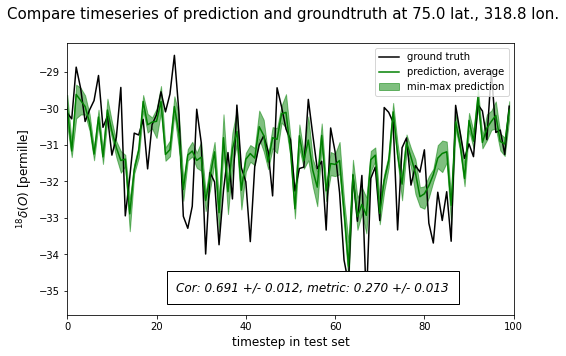

67 66


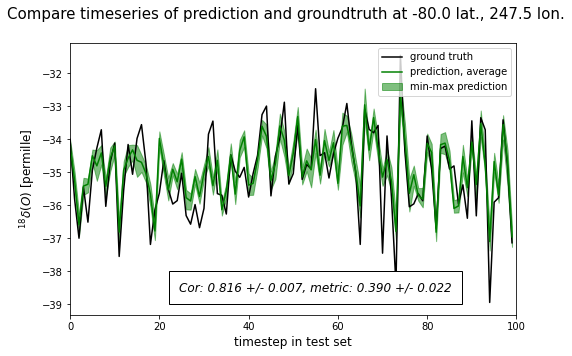

65 33


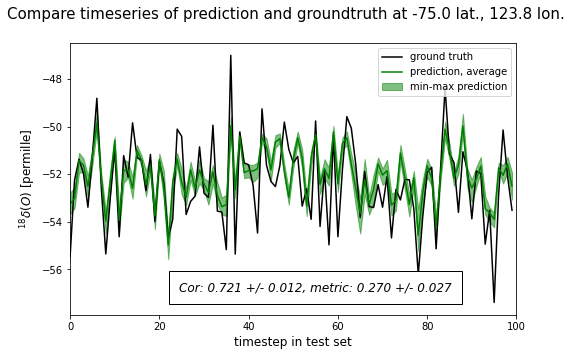

65 0


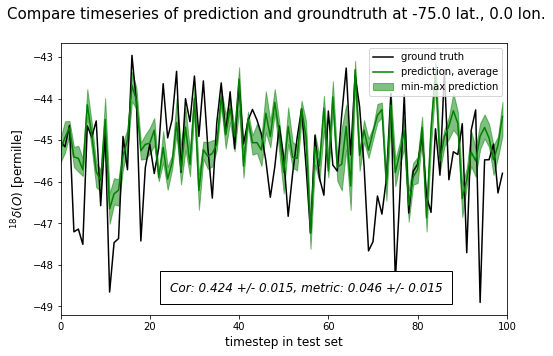

In [47]:
plot_timeseries_without_inset(75.1, -42.3, lat[0], lon[0], gt_timeseries,\
                pred_timeseries, xlims=[0,100], figsize=(8,5), savename="timeseries_no_inset_NGRIP.png")
plot_timeseries_without_inset(-79.5, -112.1, lat[0], lon[0], gt_timeseries,\
                pred_timeseries, xlims=[0,100], figsize=(8,5), savename="timeseries_no_inset_WAIS.png")
plot_timeseries_without_inset(-75.1, 123.2, lat[0], lon[0], gt_timeseries,\
                pred_timeseries, xlims=[0,100], figsize=(8,5), savename="timeseries_no_inset_DOME_C.png")
plot_timeseries_without_inset(-75.0, 0.04, lat[0], lon[0], gt_timeseries,\
                pred_timeseries, xlims=[0,100], figsize=(8,5), savename="timeseries_no_inset_Kohnen.png")


In [48]:
def find_gridbox(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def plot_testset_sites(locs, metric, lat, lon, locs_labels=None, title_fontsize=15, title=""):
    """ Get timeseries plots at the given locations (each location assumed to be given in (lat, lon) (degrees))"""
    locs_boxes = np.zeros_like(locs,dtype='int')
    for i, loc in enumerate(locs):
        locs_boxes[i,0] = int(find_gridbox(lat, loc[0]))
        locs_boxes[i,1] = int(find_gridbox(lon, loc[1]))
    
    # define markers that can be used:
    markers = ["o","P","*","D","p"]
    # make sure we have enough markers
    assert len(locs) < len(markers)
    
    ### Initial plot
    #set up colormap
    colors = ["#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#d1e5f0","#92c5de","#4393c3","#2166ac","#053061"]
    lim = math.ceil(np.max(metric))
    bounds = np.concatenate((np.array([-1.0,-0.8,-0.6,-0.4,-0.2]),np.linspace(0, lim, 6)))
    cmap= matplotlib.colors.ListedColormap(colors)
    norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
                        
    fig = plt.figure(figsize = (14,10))
    ax = fig.add_subplot(1,1,1,projection = ccrs.Robinson())
    ax.set_global()
    #remove white line
    field, lon_plot = add_cyclic_point(metric, coord = lon)
    lo, la = np.meshgrid(lon_plot, lat)
    layer = ax.pcolormesh(lo, la, field, transform=ccrs.PlateCarree(), cmap=cmap,norm=norm)
    
    for i in range(len(locs_boxes)):
        if locs_labels == None:
            ax.plot(locs[i,1],locs[i,0], marker=markers[i], linestyle="None", color="k", markersize=9, transform=ccrs.Geodetic())
        else:
            ax.plot(locs[i,1],locs[i,0], marker=markers[i], linestyle="None", color="k", markersize=9, transform=ccrs.Geodetic(), label=locs_labels[i])
       
    cbar = fig.colorbar(
        matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm),
        ticks=bounds,
        spacing='proportional',
        orientation='horizontal',
        label='Discrete intervals, some other units',
    ) 
    cbar.set_label(r"$R^2$", fontsize = 15)
    cbar.ax.tick_params(labelsize=20)
    
    ax.coastlines()

    if locs_labels != None:
        plt.legend()
    
    # calculate the global average metric
    weights = np.tile(np.cos(np.deg2rad(lat))[:,None],len(lon))
    metric_global_av = np.average(metric, weights = weights)
    
    if title == "":
        ax.set_title(r"(Test-RMSE/$\sigma_{test}) - 1$, " + \
                     "Global area weighted average: {:.3f}".format(metric_global_av), fontsize=title_fontsize)
    else:
        ax.set_title(title, fontsize=title_fontsize)
        
    plt.savefig(DIRECTORY_IMAGES + "best_drilling_sites_map.pdf")
    plt.savefig(DIRECTORY_IMAGES + "best_drilling_sites_map.png")
    plt.savefig(DIRECTORY_IMAGES + "best_drilling_sites_map.jpg")
    plt.show()
    plt.close()

In [49]:
locs = np.array([[-79.5,-112.1],[75.1,-42.3]]) # ,[-75.1, 123.4],[-75.0, 0.1]])
locs[:,1] = locs[:,1]%360
locs_labels = ["WAIS Divide", "NGRIP"] # ,"EPICA - Concordia", "EPICA - Kohnen"]

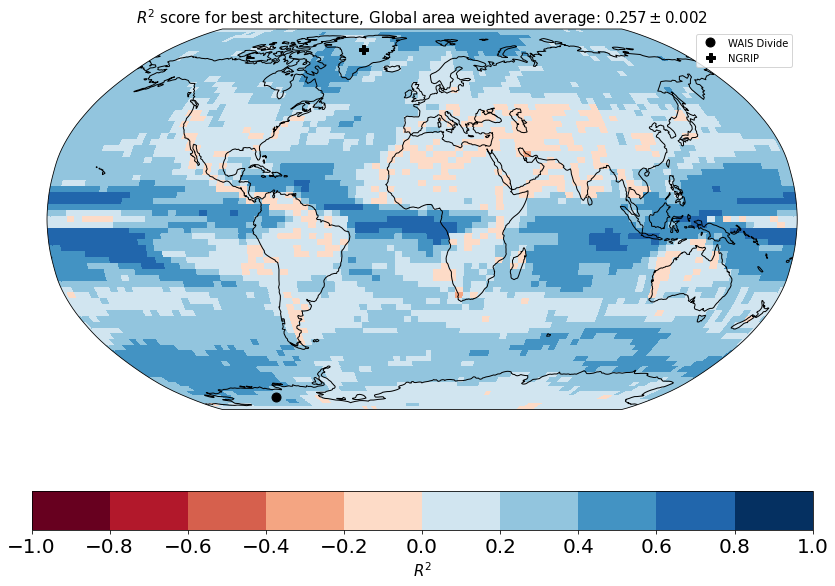

In [50]:
plot_testset_sites(locs, best_metric, lat[indices_dataset[groups[i_best]]], lon[indices_dataset[groups[i_best]]],\
                   locs_labels=locs_labels, title=r"$R^2$ score for best architecture, Global area weighted average: ${:.3f} \pm {:.3f}$".format(best_global_mean, best_global_std))